In [3]:
import matplotlib.pyplot as plt
import glob
import os
import pandas as pd
import numpy as np

## Data Concatenation and Feature Extraction

In [2]:
def dump_bearing_data(bearing_id: str, path:str) -> pd.DataFrame:

    data_dir = f'{path}/Bearing{bearing_id}'
    joined_files = os.path.join(data_dir, "acc_*.csv")
    joined_list = glob.glob(joined_files)
    
    raw_data = pd.DataFrame()

    record_count = 0

    for file in joined_list:
        file_data = pd.read_csv(file)
        file_data.columns = ['h','m','s','0.000001s','hori','verti']
        record_count = len(file_data)
        raw_data = pd.concat([raw_data, file_data[["hori","verti"]]], ignore_index=True)

    print({"bearing_id":bearing_id, "file_count":len(joined_list), "record_count":record_count})

    path = f"./Concatenated_Learning_Set/Bearing{bearing_id}"
    os.mkdir(path)

    raw_data.to_csv(f"./Concatenated_Learning_Set/Bearing{bearing_id}/Bearing{bearing_id}_Dump.csv")

    def extractFeatures(raw_data, window_size):
        def SlidingWindow(data, window_length, window_shift, column):
                mov = np.lib.stride_tricks.sliding_window_view(data[column], window_length)[::window_shift]
                return np.array(mov)

        mov1 = SlidingWindow(raw_data, window_size, window_size, "hori")
        mov2 = SlidingWindow(raw_data, window_size, window_size, "verti")

        mean_x = np.mean(mov1, axis=1).reshape(-1,1)
        rms_x = np.sqrt(np.mean(np.array(mov1)**2, axis=1)).reshape(-1,1)
        var_x = np.var(mov1, axis=1).reshape(-1,1)
        std_x = np.std(mov1, axis=1).reshape(-1,1)
        min_abs_x = np.min(np.abs(mov1), axis=1).reshape(-1,1)
        max_abs_x = np.max(np.abs(mov1), axis=1).reshape(-1,1)
        p2p_x = np.ptp(mov1, axis=1).reshape(-1,1)
        # crest_factor_x = np.max(np.abs(mov1), axis=1) / np.sqrt(np.mean(np.square(mov1), axis=1)).reshape(-1,1)
        impulse_factor_x = (np.max(np.abs(mov1),axis=1)/np.mean(np.abs(mov1),axis=1)).reshape(-1,1)
    

        mean_y = np.mean(mov2, axis=1).reshape(-1,1)
        rms_y = np.sqrt(np.mean(np.array(mov2)**2, axis=1)).reshape(-1,1)
        var_y = np.var(mov2, axis=1).reshape(-1,1)
        std_y = np.std(mov2, axis=1).reshape(-1,1)
        min_abs_y = np.min(np.abs(mov2), axis=1).reshape(-1,1)
        max_abs_y = np.max(np.abs(mov2), axis=1).reshape(-1,1)
        p2p_y = np.ptp(mov2, axis=1).reshape(-1,1)
        # crest_factor_y = np.max(np.abs(mov2), axis=1) / np.sqrt(np.mean(np.square(mov2), axis=1)).reshape(-1,1)
        impulse_factor_y = (np.max(np.abs(mov2),axis=1)/np.mean(np.abs(mov2),axis=1)).reshape(-1,1)

        columns = ["mean_x", "mean_y", "rms_x", "rms_y", "var_x", "var_y", "std_x", "std_y", "min_abs_x", "min_abs_y", "max_abs_x", "max_abs_y", "p2p_x", "p2p_y", "impulse_factor_x", "impulse_factor_y"]
        features = [mean_x, mean_y, rms_x, rms_y, var_x, var_y, std_x, std_y, min_abs_x, min_abs_y, max_abs_x, max_abs_y, p2p_x, p2p_y, impulse_factor_x, impulse_factor_y]

        return columns, features

    column_names, column_data = extractFeatures(raw_data, record_count)
    extracted_data = pd.DataFrame(np.concatenate(column_data, axis=1), columns=column_names)
    extracted_data.to_csv(f"./Concatenated_Learning_Set/Bearing{bearing_id}/Bearing{bearing_id}_Features.csv")

    return extracted_data

#### Extracting Training Data

In [ ]:
for i in range(1, 4):
    for j in range(1, 3):
        bearing_id = f"{i}_{j}"
        if(i == 3 and j == 4):
            break
        extracted_data = dump_bearing_data(bearing_id, "./ieee-phm-2012-data-challenge-dataset-master/Learning_set/")

#### Extracting Testing Data

In [ ]:
for i in range(1, 4):
    for j in range(3, 8):
        bearing_id = f"{i}_{j}"
        if(i == 3 and j == 4):
            break
        extracted_data = dump_bearing_data(bearing_id, "./ieee-phm-2012-data-challenge-dataset-master/Test_set/")

{'bearing_id': '1_3', 'file_count': 1802, 'record_count': 2559}
{'bearing_id': '1_4', 'file_count': 1139, 'record_count': 2559}
{'bearing_id': '1_5', 'file_count': 2302, 'record_count': 2559}
{'bearing_id': '1_6', 'file_count': 2302, 'record_count': 2559}
{'bearing_id': '1_7', 'file_count': 1502, 'record_count': 2559}
{'bearing_id': '2_3', 'file_count': 1202, 'record_count': 2559}
{'bearing_id': '2_4', 'file_count': 612, 'record_count': 2559}
{'bearing_id': '2_5', 'file_count': 2002, 'record_count': 2559}
{'bearing_id': '2_6', 'file_count': 572, 'record_count': 2559}
{'bearing_id': '2_7', 'file_count': 172, 'record_count': 2559}
{'bearing_id': '3_3', 'file_count': 352, 'record_count': 2559}


## Feature Visualization

#### Signal Data Visualization

In [ ]:
bearing_data = pd.DataFrame()

bearing_ids = ["1_1", "1_2", "2_1", "2_2", "3_1", "3_2", "1_3", "1_4", "1_5", "1_6", "1_7", "2_3", "2_4", "2_5", "2_6", "2_7", "3_3"]
for bearing_id in bearing_ids:
    path = f"./Concatenated_Learning_Set/Bearing{bearing_id}/Bearing{bearing_id}_Dump.csv"
    read_data = pd.read_csv(path)
    columns = [f"Hori_{bearing_id}", f"Verti_{bearing_id}"]
    bearing_data[columns[0]] = read_data["hori"]
    bearing_data[columns[1]] = read_data["verti"]

In [ ]:
bearing_data.head()

,Hori_1_1,Verti_1_1,Hori_1_2,Verti_1_2,Hori_2_1,Verti_2_1,Hori_2_2,Verti_2_2,Hori_3_1,Verti_3_1,...,Hori_2_4,Verti_2_4,Hori_2_5,Verti_2_5,Hori_2_6,Verti_2_6,Hori_2_7,Verti_2_7,Hori_3_3,Verti_3_3
0,0.501,-0.480,0.165,-0.140,0.292,0.133,0.125,-0.104,0.278,0.285,...,-0.178,0.137,0.148,0.208,-0.030,-0.542,0.680,-0.213,-0.321,0.196
1,0.138,0.435,0.125,0.542,0.596,0.024,0.035,-0.314,0.143,0.590,...,-0.323,0.177,-0.042,-0.124,-0.382,0.027,0.073,-0.186,-0.224,0.332
2,-0.423,0.240,0.157,-0.261,0.230,0.272,-0.092,0.200,0.090,-0.193,...,0.183,0.032,-0.489,0.032,-0.294,0.319,-0.673,0.305,0.110,-0.189
3,-0.802,0.020,0.421,0.081,-0.225,0.272,0.033,0.211,0.035,-0.109,...,0.562,-0.471,-0.385,-0.373,-0.033,0.485,-0.602,0.303,0.157,-0.426
4,-0.364,0.112,0.683,-0.278,-0.222,-0.263,-0.022,-0.101,0.086,0.281,...,0.210,-0.295,-0.114,0.313,0.293,-0.030,-0.223,0.154,0.255,0.036


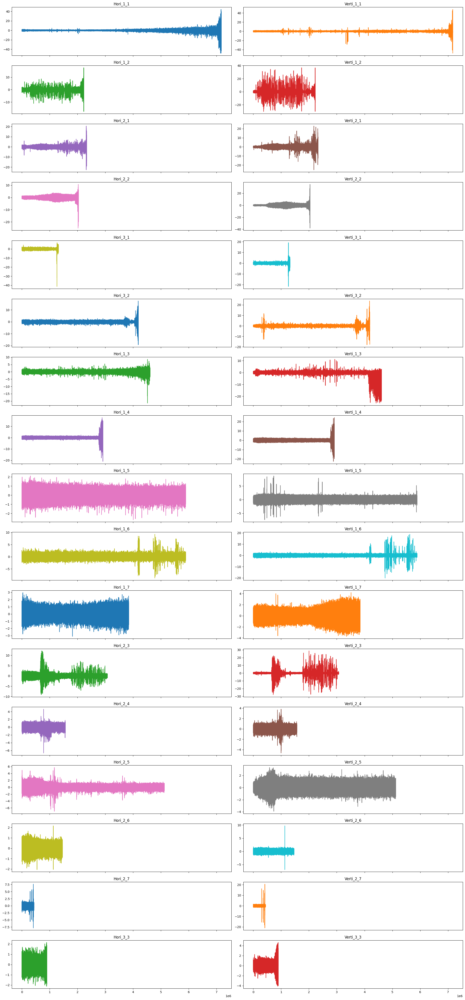

In [ ]:
fig, axes = plt.subplots(nrows=17, ncols=2, figsize=(21, 45), sharex=True)

bearing_data.plot(subplots=True, legend=False, ax=axes)
# fig.suptitle(f"Bearing {feature_name}")

for i, ax in enumerate(axes.flatten()):
    ax.set_title(bearing_data.columns[i])

plt.tight_layout()

#### Extracted Feature Visualization

In [7]:
feature_grouped_df = {}

columns = ["mean_x", "mean_y", "rms_x", "rms_y", "var_x", "var_y", "std_x", "std_y", "min_abs_x", "min_abs_y", "max_abs_x", "max_abs_y", "p2p_x", "p2p_y", "impulse_factor_x", "impulse_factor_y"]

bearing_ids = ["1_1", "1_2", "2_1", "2_2", "3_1", "3_2", "1_3", "1_4", "1_5", "1_6", "1_7", "2_3", "2_4", "2_5", "2_6", "2_7", "3_3"]

# bearing_ids = ["1_1", "1_2", "2_1", "2_2", "3_1", "3_2"]

for c in columns:
    feature_grouped_df[c] = pd.DataFrame()


for bearing_id in bearing_ids:
    path = f"./Concatenated_Learning_Set/Bearing{bearing_id}/Bearing{bearing_id}_Features.csv"
    bearing_data = pd.read_csv(path)
    for c in columns:
        feature_grouped_df[c][bearing_id] = bearing_data[c]

# for c in columns:
#     feature_grouped_df[c]["temp"] = [1]*2803

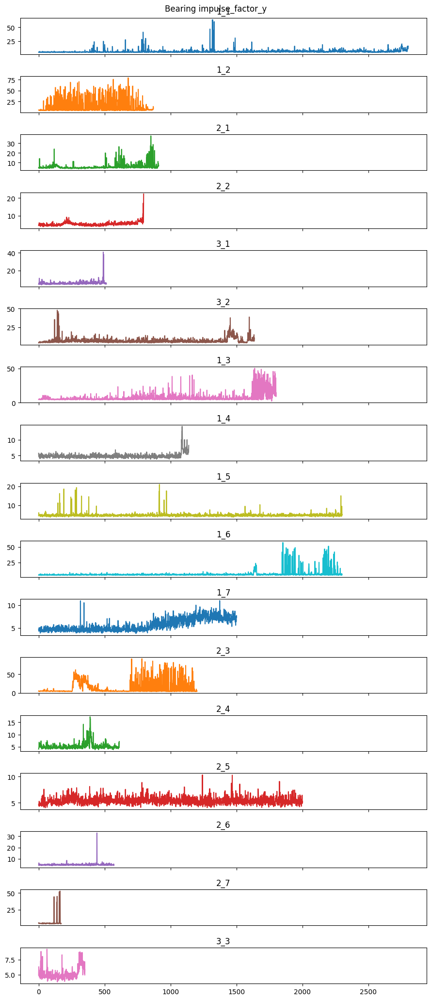

In [50]:
feature_name = 'impulse_factor_y'

# fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(21, 36), sharex=True)
fig, axes = plt.subplots(nrows=17, ncols=1, figsize=(9, 21), sharex=True)

# df = (feature_grouped_df["rms_x"] + 0.00*feature_grouped_df["impulse_factor_x"])
df = feature_grouped_df[feature_name]
df.plot(subplots=True, legend=False, ax=axes)
fig.suptitle(f"Bearing {feature_name}")

for i, ax in enumerate(axes.flatten()):
    ax.set_title(df.columns[i])

plt.tight_layout()

In [9]:
rms_x_cpy = feature_grouped_df["impulse_factor_x"]
rms_x_cpy.head()

,1_1,1_2,2_1,2_2,3_1,3_2,1_3,1_4,1_5,1_6,1_7,2_3,2_4,2_5,2_6,2_7,3_3
0,4.458401,5.511446,4.368783,5.632768,7.113495,4.430882,4.452635,4.675354,4.589956,7.043006,5.272547,4.501893,4.215888,6.373946,4.570925,4.159750,5.592069
1,4.464630,4.930401,4.894599,4.411351,4.466766,4.133769,4.872274,4.632474,5.033701,4.571252,4.959673,7.073069,4.315790,6.114797,4.112261,5.802970,5.109734
2,4.507294,4.257334,5.903296,4.679432,5.046988,6.750862,5.267800,4.849386,4.792617,7.335400,4.813491,6.216111,4.833187,7.572228,5.167267,4.739992,4.439384
3,4.346564,4.621566,5.328253,4.755215,4.672037,4.439202,5.413531,4.534995,4.848966,5.934470,4.704551,5.328684,4.088884,3.756110,4.428888,7.346107,4.307790
4,3.892506,4.409813,5.452365,4.952636,5.314931,5.514932,5.047706,4.291390,4.776958,5.539608,4.761706,4.984472,5.675467,3.023106,4.762340,6.543979,4.406158


In [54]:
from sklearn.linear_model import LinearRegression, Ridge
from scipy import signal as sg

def reconstructSignal(data: pd.DataFrame, windowFactor: float, preSmoothingFactor: float, slopeThreshold: float, elevationFactor: float, postSmoothingFactor: float):
    dat = pd.DataFrame()
    plt.figure(figsize=(18, 21.6), dpi=150)
    index = 1
    for columnName in data.columns:

        # load signal and remove all nan values
        signal = data[columnName]
        signal = signal[~np.isnan(signal)]

        # smoothen signal to denoise
        for i in range(5):
            signal = sg.savgol_filter(signal, len(signal)//preSmoothingFactor, 2, mode="nearest")

        # processing code ------------------------------------------------------------------------------------------------------------------------------------------------------

        # sliding window function
        def SlidingWindow(data, window_length, window_shift):
            mov = np.lib.stride_tricks.sliding_window_view(data, window_length)[::window_shift]
            return np.array(mov)
        
        # compute non - overlapping sliding window
        print(len(signal), windowFactor, len(signal)//windowFactor)
        # size_shift = max(10, len(signal)//windowFactor)
        size_shift = windowFactor
        signal_windows = SlidingWindow(signal, size_shift, size_shift)

        prev_chunk_end = None

        processed_signal = np.array([])

        # plot signal chunks
        plt.subplot(9,2,index), plt.title("Bearing " + columnName), plt.tight_layout()
        for i in range(len(signal_windows)):
            # store original signal chunk
            signal_chunk = signal_windows[i]
            time_chunk = np.array(range(size_shift * i, (size_shift * i) + size_shift, 1))

            # compute regression line
            model = LinearRegression()
            model.fit(time_chunk.reshape(-1, 1), signal_chunk.reshape(-1, 1))
            regression_line = model.predict(time_chunk.reshape(-1, 1))

            # compute new signal chunk
            signal_chunk_new = signal_chunk
            if(model.coef_[0][0] < 0 and i > 0):
                signal_chunk_new = signal_chunk_new / (regression_line.flatten() / elevationFactor)
            
            # smoothen the new signal chunk for noise reduction
            if(postSmoothingFactor > 0 and model.coef_[0][0] < slopeThreshold):
                for i in range(5):
                    signal_chunk_new = sg.savgol_filter(signal_chunk_new, len(signal_chunk_new)//postSmoothingFactor, 2, mode="nearest")

            # vertically offset the new signal chunk to make data continuous
            if(prev_chunk_end != None):
                signal_chunk_new = signal_chunk_new + (prev_chunk_end - signal_chunk_new[0])
            prev_chunk_end = signal_chunk_new[-1]

            # add it to the current processed signal chunk array
            processed_signal = np.append(processed_signal, signal_chunk_new)

            # # plot signal chunk
            # plt.plot(time_chunk, signal_chunk)
            
            # plot regression line with corner markers
            plt.plot(time_chunk, regression_line, color="black", zorder=5, lw=1)
            # plt.scatter(time_chunk[0], regression_line[0], marker='o', color='black', zorder=5, s=21)
            # plt.scatter(time_chunk[-1], regression_line[-1], marker='o', color='black', zorder=5, s=21)

            # plot newly computed signal
            plt.plot(time_chunk, signal_chunk_new, color="red", lw=1)

            plt.legend(['Regression Line', 'Reconstructed Signal'], loc='upper left')

            # plot signal chunk
            plt.plot(time_chunk, signal_chunk)
            # return

        # ----------------------------------------------

        # add additional zeros
        processed_signal = np.append(processed_signal, np.array([0] * (3000 - len(processed_signal))), axis=0)

        # store data
        dat[columnName] = processed_signal
        index += 1

        # reset processed signal
        processed_signal = np.array([])

    return dat

Constant window size may be 
1) Too large for shorter signals and will end up capturing noise as shown below.
2) Too small for lengthier signals and will require more computation time and can end up being a sub optimal solution

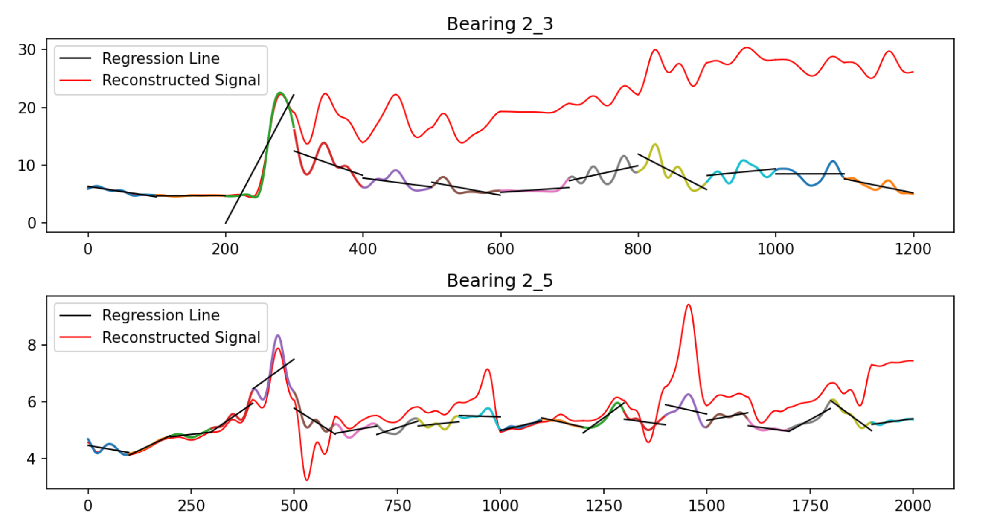

Hence there is a need for dynamic window size. Here, a silding window is non-overlapping and its size is determined by the function max(10, signalsize//**C**) where **C** is a configurable parameter

2803 100 28
871 100 8
911 100 9
797 100 7
515 100 5
1637 100 16
1802 100 18
1139 100 11
2302 100 23
2302 100 23
1502 100 15
1202 100 12
612 100 6
2002 100 20
572 100 5
172 100 1
352 100 3


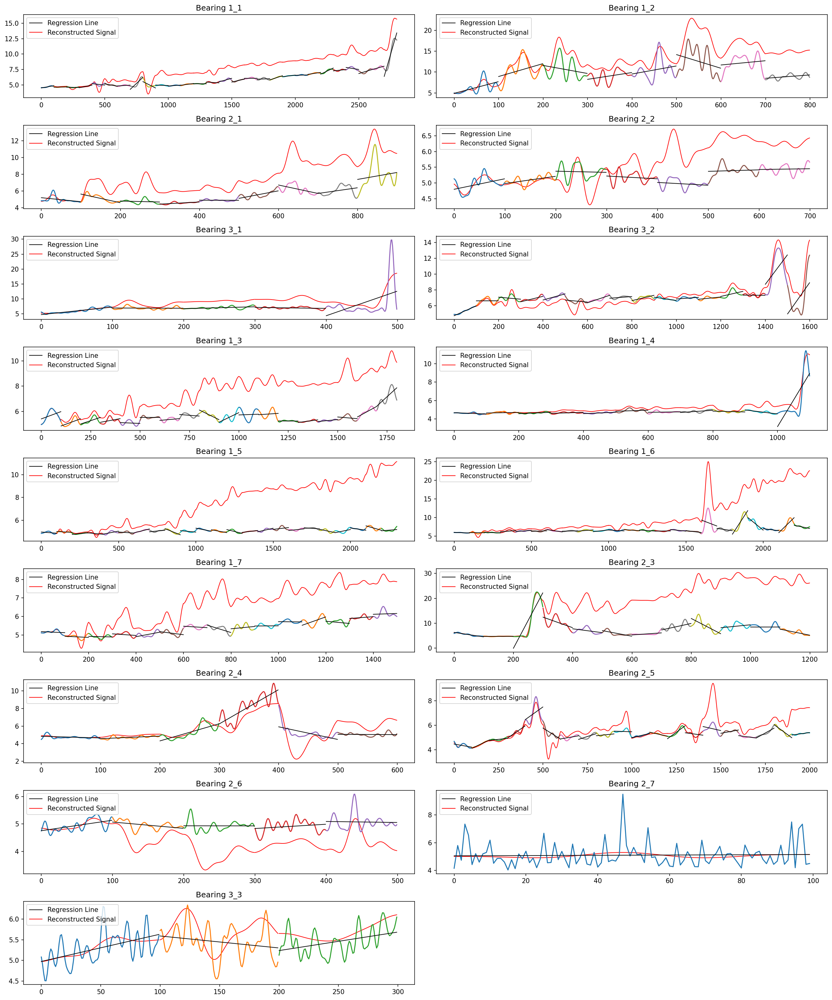

In [55]:
processed_rms = reconstructSignal(rms_x_cpy, preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=20.1, postSmoothingFactor=3)

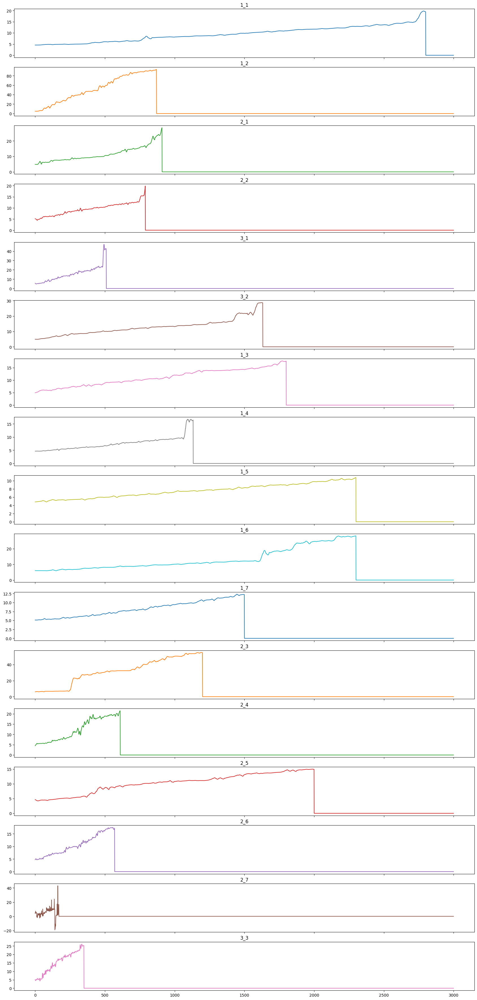

In [11]:
fig, axes = plt.subplots(nrows=17, ncols=1, figsize=(21, 45), sharex=True)

processed_rms.plot(subplots=True, legend=False, ax=axes)
# fig.suptitle(f"Bearing {feature_name}")

for i, ax in enumerate(axes.flatten()):
    ax.set_title(processed_rms.columns[i])

# plt.tight_layout()

## Slope Adaptive Signal Decomposition

In [4]:
# First signal is broken down into chunks

# signal x = [x1, x2, ... xi]

# size of chunk determined by a parameter b

# w = max(10, len(x)//b)

# (10 gives decent results for all cases but is sub optimal due to increased computation and so we need adaptive window size w)

# chunks = [ x[0:w-1], x[w:2w-1], x[2w:3w-1], ... x[nw:(n+1)w-1] ]

# for each chunk in chunks:
# 	compute linear regression line on chunk using ordinary least squares
# 	f(x) = mx + c

# 	elevation factor, alpha (between 0 and 1) controlls how much new chunk is elevated (and also exaggerates noise)

# 	if( slope m < 0 and this is not the first chunk)
#       here f(chunk) is the regression line for the chunk
# 
# 		new_chunk = chunk / ( f(chunk) * alpha )
# 		chunk = new chunk

# 	some chunks may not have negative slope so the signal is discontinuous, so we offset it by difference between previous end and current chunk start
# 	chunk = chunk + (previous_chunk[-1] - chunk[0])

# concatenate all chunks and replot

In [1]:
from sklearn.linear_model import LinearRegression
from scipy import signal as sg
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def SASD(id: str, data: np.ndarray, windowFactor: float, preSmoothingFactor: float, slopeThreshold: float, elevationFactor: float, postSmoothingFactor: float, plot=False):
    # load signal and remove all nan values
    signal = data
    signal = signal[~np.isnan(signal)]

    # smoothen signal to denoise
    for i in range(5):
        signal = sg.savgol_filter(signal, len(signal)//preSmoothingFactor, 2, mode="nearest")

    # processing code ------------------------------------------------------------------------------------------------------------------------------------------------------

    # sliding window function
    def SlidingWindow(data, window_length, window_shift):
        mov = np.lib.stride_tricks.sliding_window_view(data, window_length)[::window_shift]
        return np.array(mov)
    
    # compute non - overlapping sliding window
    # print(f"Size: {len(signal)}\nWindow Factor: {windowFactor}\nChunks: {len(signal)//windowFactor}")
    size_shift = max(10, len(signal)//windowFactor)
    signal_windows = SlidingWindow(signal, size_shift, size_shift)

    prev_chunk_end = None

    processed_signal = np.array([])

    if(plot):
        plt.figure(figsize=(3,3))
        plt.title(id)
    for i in range(len(signal_windows)):
        # store original signal chunk
        signal_chunk = signal_windows[i]
        time_chunk = np.array(range(size_shift * i, (size_shift * i) + size_shift, 1))

        # compute regression line
        model = LinearRegression()
        model.fit(time_chunk.reshape(-1, 1), signal_chunk.reshape(-1, 1))
        regression_line = model.predict(time_chunk.reshape(-1, 1))

        # compute new signal chunk
        signal_chunk_new = signal_chunk
        if(model.coef_[0][0] < 0 and i > 0):
            signal_chunk_new = signal_chunk_new / (regression_line.flatten() / elevationFactor)
        
        # smoothen the new signal chunk for noise reduction
        if(postSmoothingFactor > 0 and model.coef_[0][0] < slopeThreshold):
            for i in range(5):
                signal_chunk_new = sg.savgol_filter(signal_chunk_new, len(signal_chunk_new)//postSmoothingFactor, 2, mode="nearest")

        # vertically offset the new signal chunk to make data continuous
        if(prev_chunk_end != None):
            signal_chunk_new = signal_chunk_new + (prev_chunk_end - signal_chunk_new[0])
        prev_chunk_end = signal_chunk_new[-1]

        # add it to the current processed signal chunk array
        processed_signal = np.append(processed_signal, signal_chunk_new)

        if(plot):
            # plot signal chunk
            plt.plot(time_chunk, signal_chunk)
            
            # plot regression line with corner markers
            plt.plot(time_chunk, regression_line, color="black", zorder=5, lw=0.75)
            # plt.scatter(time_chunk[0], regression_line[0], marker='o', color='black', zorder=5, s=21)
            # plt.scatter(time_chunk[-1], regression_line[-1], marker='o', color='black', zorder=5, s=21)

            # plot newly computed signal
            plt.plot(time_chunk, signal_chunk_new, color="red", lw=1)

    # ----------------------------------------------

    # add additional zeros
    # processed_signal = np.append(processed_signal, np.array([0] * (3000 - len(processed_signal))), axis=0)

    if(plot):
        plt.tight_layout()
        plt.show()
    return processed_signal

In [56]:
# SASD(data=bearing_rms[id], id=str(id), preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=21, postSmoothingFactor=3)

In [41]:
# 1_3, 2_6 for showing that Y is worse
# 1_1, 2_1  for showing that impulse factor is best

C:\Users\devbh\AppData\Local\Temp\ipykernel_27728\754401779.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(features))  # Get a colormap with enough unique colors


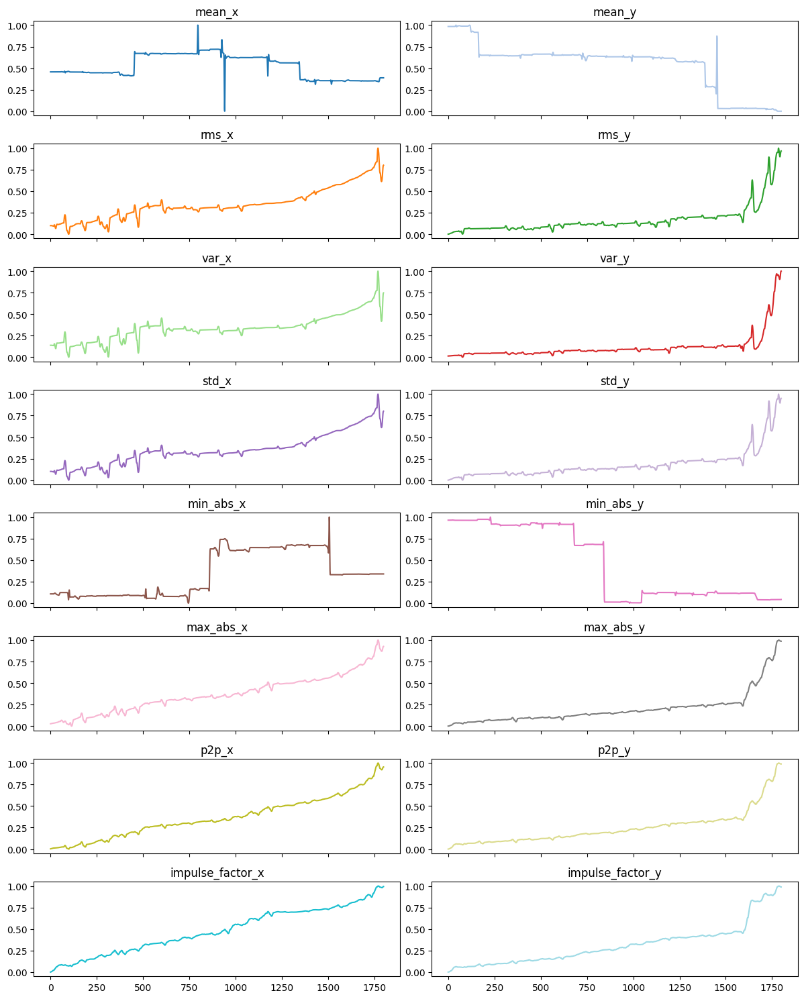

In [5]:
from sklearn.preprocessing import MinMaxScaler

path = "./Concatenated_Learning_Set/Bearing1_3/Bearing1_3_Features.csv"
bearing_data = pd.read_csv(path)

# Specify the features to be used
features = ["mean_x", "mean_y", "rms_x", "rms_y", "var_x", "var_y", "std_x", "std_y", 
            "min_abs_x", "min_abs_y", "max_abs_x", "max_abs_y", "p2p_x", "p2p_y", 
            "impulse_factor_x", "impulse_factor_y"]

transformed_features = pd.DataFrame()

# Apply SASD transformation and normalization to each feature
for feature in features:
    signal = bearing_data[feature]
    sasd_signal = SASD(id=feature, data=signal.values, preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=21, postSmoothingFactor=3)
    scaler = MinMaxScaler()
    normalized_signal = scaler.fit_transform(sasd_signal.reshape(-1, 1)).flatten()
    transformed_features[feature] = normalized_signal

# Plot the SASD-transformed signals with different colors
colors = plt.cm.get_cmap('tab20', len(features))  # Get a colormap with enough unique colors
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(12, 15), sharex=True)

for i, feature in enumerate(features):
    ax = axes[i//2, i%2]
    ax.plot(transformed_features[feature], color=colors(i), label=feature)
    ax.set_title(feature)
    # ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

## PreProcessing

#### Load RMS Features of Signals

In [11]:
bearing_ids = ["1_1", "1_2", "2_1", "2_2", "3_1", "3_2", "1_3", "1_4", "1_5", "1_6", "1_7", "2_3", "2_4", "2_5", "2_6", "2_7", "3_3"]
bearing_rms = pd.DataFrame()

for id in bearing_ids:
    path = f"./Concatenated_Learning_Set/Bearing{id}/Bearing{id}_Features.csv"
    rms = pd.read_csv(path)["impulse_factor_x"]
    rms.name = f"ImpulseFactor_{id}"
    bearing_rms = pd.concat([bearing_rms, rms], axis=1)

#### Perform SASD Transformation and Normalization

In [22]:
from sklearn.preprocessing import MinMaxScaler

transformed_rms = pd.DataFrame()

for id in bearing_rms.columns:
    # new_signal = pd.Series(SASD(bearing_rms[id], preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=2.1, postSmoothingFactor=3))
    new_signal = pd.Series(SASD(data=bearing_rms[id], id=str(id), preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=21, postSmoothingFactor=3))

    # normalize values
    scaler = MinMaxScaler()
    normalized_data = scaler.fit_transform(new_signal.values.reshape(-1, 1))
    new_signal_normalized = pd.Series(normalized_data.flatten())

    # store values
    new_signal_normalized.name = id
    transformed_rms = pd.concat([transformed_rms, new_signal_normalized], axis=1)


In [23]:
transformed_rms.to_csv("./SASD Extracted Data/RAW.csv")

#### Fit Exponential Decay Curve

In [6]:
from scipy.optimize import curve_fit

def fit_ExponentialDecayCurve(data: pd.Series) -> np.ndarray:
    time = np.array(list(range(0, len(data), 1)))
    
    def decay_function(t, A, B):
        return A / np.exp(np.clip(B * t, -700, 700))
    
    params, covariance = curve_fit(decay_function, time, data)

    A_fit, B_fit = params

    return decay_function(time, A_fit, B_fit)

#### Fit Logistic Growth Model

In [7]:
from scipy.optimize import curve_fit

def fit_LogisticGrowthModel(data: pd.Series) -> np.ndarray:
    time = np.array(list(range(0, len(data), 1)))
    
    def logistic_growth(t, L, k, t0):
        return L / (1 + np.exp(-k * (t - t0)))
    
    popt, pcov = curve_fit(logistic_growth, time, data, p0=[max(data), 0.5, np.median(time)], maxfev=2000000)

    L_opt, k_opt, t0_opt = popt

    return logistic_growth(time, L_opt, k_opt, t0_opt)

#### Fit Models for all bearings and dump

In [8]:
from sklearn.preprocessing import MinMaxScaler

exp_fit = pd.DataFrame()
logistic_fit = pd.DataFrame()

for id in transformed_rms.columns:
    print(id)
    dat = transformed_rms[id]
    dat = dat[~np.isnan(dat)]

    exp = fit_ExponentialDecayCurve(dat)
    logistic = fit_LogisticGrowthModel(dat)

    # store values
    exp = pd.Series(exp)
    exp.name = id

    logistic = pd.Series(logistic)
    logistic.name = id

    exp_fit = pd.concat([exp_fit, exp], axis=1)
    logistic_fit = pd.concat([logistic_fit, logistic], axis=1)

exp_fit.to_csv("./SASD Extracted Data/EXP.csv")
logistic_fit.to_csv("./SASD Extracted Data/LOGISTIC.csv")

ImpulseFactor_1_1
ImpulseFactor_1_2
ImpulseFactor_2_1
ImpulseFactor_2_2
ImpulseFactor_3_1
ImpulseFactor_3_2
ImpulseFactor_1_3
ImpulseFactor_1_4
ImpulseFactor_1_5
ImpulseFactor_1_6
ImpulseFactor_1_7
ImpulseFactor_2_3
ImpulseFactor_2_4
ImpulseFactor_2_5
ImpulseFactor_2_6
ImpulseFactor_2_7
ImpulseFactor_3_3


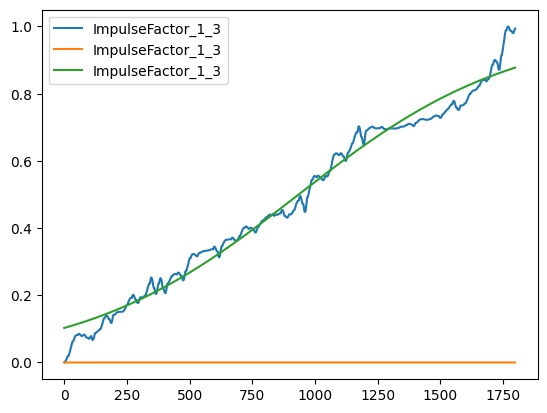

In [37]:
id = "ImpulseFactor_1_3"

transformed_rms[id].plot()
exp_fit[id].plot()
logistic_fit[id].plot()

plt.legend()

## SASD RUL - Pronostia Dataset

#### Model Training imports

In [153]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error
from keras.models import Sequential
from keras.layers import Dense, LSTM, GRU, Input
from keras.callbacks import EarlyStopping

In [196]:
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

def get_scores(y_test, y_pred):
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    nrmse = rmse / np.abs(np.max(y_test) - np.min(y_test))
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)

    # pronostia scoring
    def compute_score(percent_error):
        if percent_error <= 0:  # Late predictions
            return np.exp(-np.log(0.5) * (percent_error / 5))
        else:  # Early predictions
            return np.exp(np.log(0.5) * (percent_error / 20))
    percent_errors = 100 * (y_test - y_pred.flatten()) / y_test
    scores = [compute_score(err) for err in percent_errors]
    final_error = np.mean(percent_errors)
    final_score = np.mean(scores)
    return {"R2": r2, "mse":mse, "rmse":rmse, "nrmse": nrmse, "mae":mae, "mape":mape, "pro_error": final_error, "pro_score": final_score}

callback = EarlyStopping(monitor='loss', patience=9)

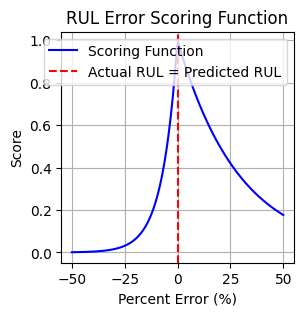

In [78]:
import numpy as np
import matplotlib.pyplot as plt

# Define the scoring function
def compute_score(percent_error):
    if percent_error <= 0:  # Late predictions
        return np.exp(-np.log(0.5) * (percent_error / 5))
    else:  # Early predictions
        return np.exp(np.log(0.5) * (percent_error / 20))

# Generate percent error values from -50% to 50%
percent_errors = np.linspace(-50, 50, 200)
scores = [compute_score(err) for err in percent_errors]

# Plot the scoring function
plt.figure(figsize=(3, 3))
plt.plot(percent_errors, scores, label="Scoring Function", color="blue")
plt.title("RUL Error Scoring Function")
plt.xlabel("Percent Error (%)")
plt.ylabel("Score")
plt.axvline(0, color='red', linestyle='--', label="Actual RUL = Predicted RUL")
plt.legend()
plt.grid(True)
plt.show()


Percent Errors and Scores:
Test 1: Actual RUL = 100, Predicted RUL = 110, Percent Error = -10.00%, Score = 0.2500
Test 2: Actual RUL = 90, Predicted RUL = 85, Percent Error = 5.56%, Score = 0.8249
Test 3: Actual RUL = 85, Predicted RUL = 80, Percent Error = 5.88%, Score = 0.8156
Test 4: Actual RUL = 75, Predicted RUL = 70, Percent Error = 6.67%, Score = 0.7937
Test 5: Actual RUL = 65, Predicted RUL = 60, Percent Error = 7.69%, Score = 0.7660
Test 6: Actual RUL = 60, Predicted RUL = 55, Percent Error = 8.33%, Score = 0.7492
Test 7: Actual RUL = 50, Predicted RUL = 55, Percent Error = -10.00%, Score = 0.2500
Test 8: Actual RUL = 45, Predicted RUL = 40, Percent Error = 11.11%, Score = 0.6804
Test 9: Actual RUL = 30, Predicted RUL = 25, Percent Error = 16.67%, Score = 0.5612
Test 10: Actual RUL = 20, Predicted RUL = 15, Percent Error = 25.00%, Score = 0.4204
Test 11: Actual RUL = 10, Predicted RUL = 5, Percent Error = 50.00%, Score = 0.1768

Final % Error: 10.6280

Final Score: 0.5716


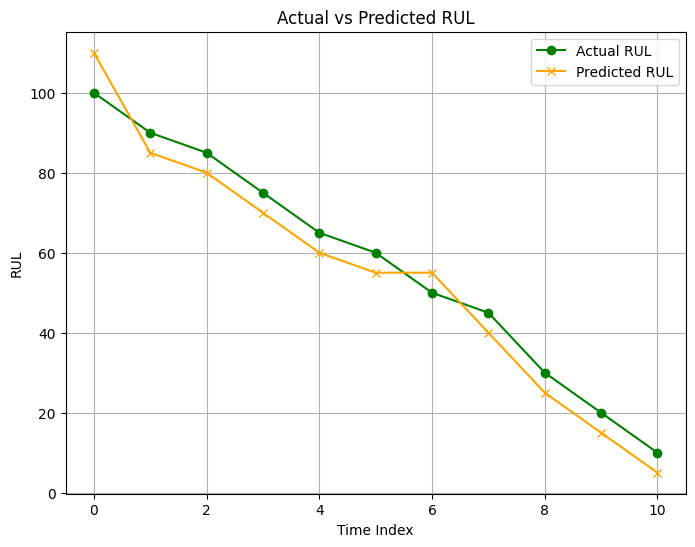

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Define the scoring function
def compute_score(percent_error):
    if percent_error <= 0:  # Late predictions
        return np.exp(-np.log(0.5) * (percent_error / 5))
    else:  # Early predictions
        return np.exp(np.log(0.5) * (percent_error / 20))

# Example actual and predicted RUL arrays
actual_rul = np.array([100, 90, 85, 75, 65, 60, 50, 45, 30, 20, 10])  # Actual RULs
predicted_rul = np.array([110, 85, 80, 70, 60, 55, 55, 40, 25, 15, 5])  # Predicted RULs

# Compute percent errors and scores
percent_errors = 100 * (actual_rul - predicted_rul) / actual_rul
scores = [compute_score(err) for err in percent_errors]

# Compute the final score (mean of individual scores)
final_error = np.mean(percent_errors)
final_score = np.mean(scores)

# Print percent errors, corresponding scores, and the final score
print("Percent Errors and Scores:")
for i, (actual, predicted, error, score) in enumerate(zip(actual_rul, predicted_rul, percent_errors, scores)):
    print(f"Test {i+1}: Actual RUL = {actual}, Predicted RUL = {predicted}, Percent Error = {error:.2f}%, Score = {score:.4f}")

print(f"\nFinal % Error: {final_error:.4f}")
print(f"\nFinal Score: {final_score:.4f}")

# Plot actual and predicted RUL curves
plt.figure(figsize=(8, 6))
plt.plot(actual_rul, label="Actual RUL", color="green", marker='o')
plt.plot(predicted_rul, label="Predicted RUL", color="orange", marker='x')
plt.title("Actual vs Predicted RUL")
plt.xlabel("Time Index")
plt.ylabel("RUL")
plt.legend()
plt.grid(True)
plt.show()



In [79]:
transformed_rms = pd.read_csv("./SASD Extracted Data/RAW.csv", index_col=0)
exp_fit = pd.read_csv("./SASD Extracted Data/EXP.csv", index_col=0)
logistic_fit = pd.read_csv("./SASD Extracted Data/LOGISTIC.csv", index_col=0)

#### Polynomial Regression - Logistic Growth

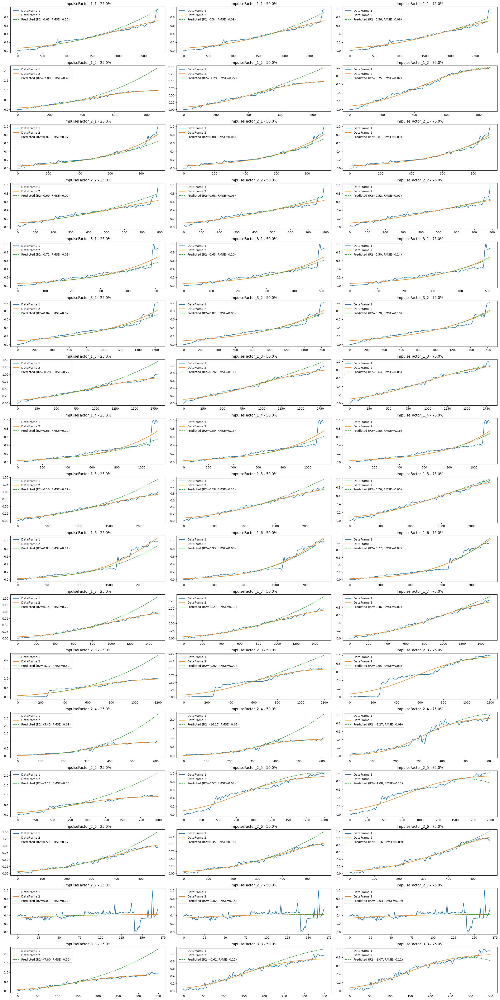

In [96]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_logistic = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)]

    signal_df2 = logistic_fit[signal]
    signal_df2 = signal_df2[~np.isnan(signal_df2)]

    score = []
    
    for j, percentage in enumerate(percentages):
        train_size = int(len(signal_df2) * percentage)
        train_data, test_data = signal_df2[:train_size], signal_df2[train_size:]
        
        X_train = np.arange(len(train_data)).reshape(-1, 1)
        y_train = train_data.values.reshape(-1, 1)
        
        X_test = np.arange(len(train_data), len(signal_df2)).reshape(-1, 1)
        
        degree = 3
        poly_features = PolynomialFeatures(degree=degree)
        X_train_poly = poly_features.fit_transform(X_train)
        X_test_poly = poly_features.transform(X_test)
        
        model = LinearRegression()
        model.fit(X_train_poly, y_train)
        
        y_pred = model.predict(X_test_poly)

        scores = get_scores(signal_df1[train_size:], y_pred.flatten())
        r2 = r2_score(signal_df1[train_size:], y_pred)
        rmse = np.sqrt(mean_squared_error(signal_df1[train_size:], y_pred))

        score.append(scores)
        
        axs[i, j].plot(signal_df1, label='DataFrame 1')
        axs[i, j].plot(signal_df2, label='DataFrame 2')
        axs[i, j].plot(np.arange(len(train_data), len(signal_df2)), y_pred, label=f'Predicted (R2={r2:.2f}, RMSE={rmse:.2f})', linestyle='dashed')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_logistic.append({signal: score})

plt.tight_layout()
plt.show()

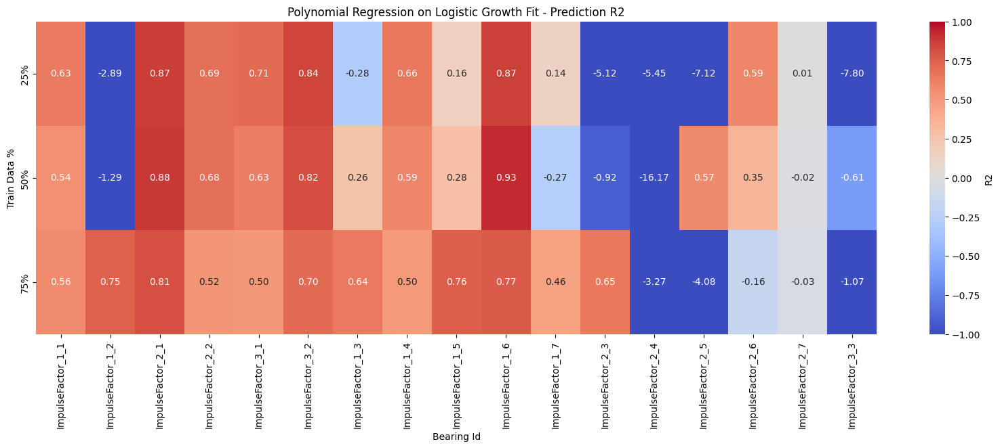

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_logistic:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('Polynomial Regression on Logistic Growth Fit - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [99]:
r2_scores_dict = {}
for item in r2_scores_logistic:
    for key, value in item.items():
        r2_scores_dict[key] = [d['mape'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.156302,0.368784,0.095276,0.126278,0.143888,0.120908,0.205451,0.169424,0.188439,0.189858,0.195976,0.457836,0.558466,0.451186,0.159660,1.442542e+13,0.506810
1,0.122571,0.195874,0.060338,0.088378,0.135662,0.101082,0.113326,0.163709,0.130921,0.133244,0.177608,0.227552,0.564193,0.099511,0.149714,2.216635e+13,0.164805
2,0.106028,0.015693,0.088692,0.105296,0.203955,0.130485,0.058698,0.238611,0.052049,0.063132,0.079606,0.026145,0.101201,0.091093,0.074101,4.374119e+13,0.086424


In [100]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/Poly_Reg_Logistic.json", 'w') as fp:
    dat = json.dumps(r2_scores_logistic, indent=4)
    fp.write(dat)

#### GPR - Logistic Growth

c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations

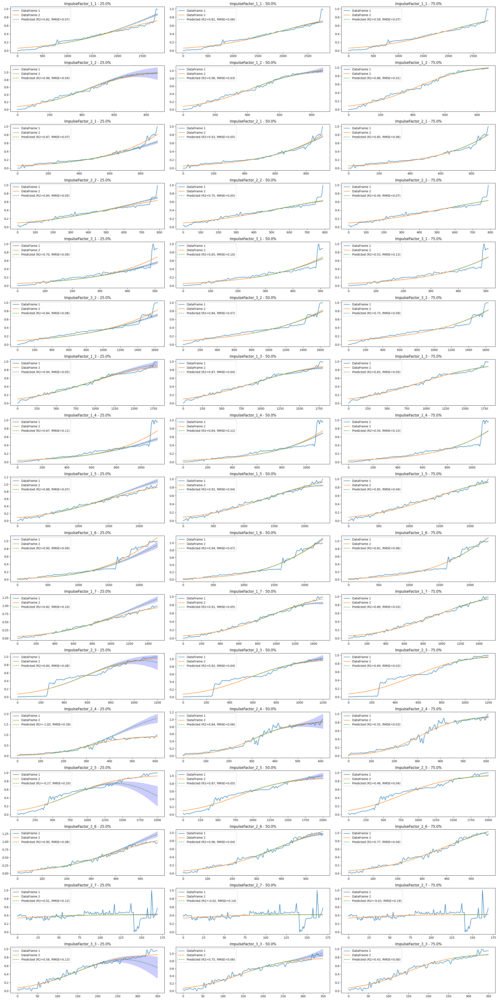

In [101]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error

percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_GPR_logistic = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)]

    signal_df2 = logistic_fit[signal]
    signal_df2 = signal_df2[~np.isnan(signal_df2)]

    score = []
    
    for j, percentage in enumerate(percentages):
        train_size = int(len(signal_df2) * percentage)
        train_data, test_data = signal_df2[:train_size], signal_df2[train_size:]
        
        X_train = np.arange(len(train_data)).reshape(-1, 1)
        y_train = train_data.values.reshape(-1, 1)
        
        X_test = np.arange(len(train_data), len(signal_df2)).reshape(-1, 1)
        
        kernel = RBF(length_scale=1.0)
        gpr = GaussianProcessRegressor(kernel=kernel, random_state=3)
        
        gpr.fit(X_train, y_train.flatten())
        
        y_pred, sigma = gpr.predict(X_test, return_std=True)
        
        scores = get_scores(signal_df1[train_size:], y_pred)
        r2 = r2_score(signal_df1[train_size:], y_pred)
        rmse = np.sqrt(mean_squared_error(signal_df1[train_size:], y_pred))

        score.append(scores)
        
        axs[i, j].plot(signal_df1, label='DataFrame 1')
        axs[i, j].plot(signal_df2, label='DataFrame 2')
        axs[i, j].plot(np.arange(len(train_data), len(signal_df2)), y_pred, label=f'Predicted (R2={r2:.2f}, RMSE={rmse:.2f})', linestyle='dashed')
        axs[i, j].fill_between(np.arange(len(train_data), len(signal_df2)), y_pred - sigma, y_pred + sigma, alpha=0.2, color='blue')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_GPR_logistic.append({signal: score})

plt.tight_layout()
plt.show()


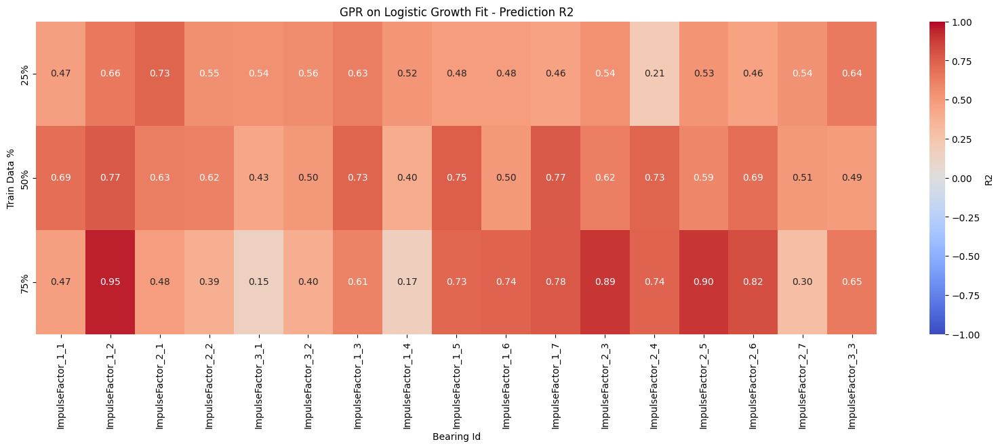

In [107]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_GPR_logistic:
    for key, value in item.items():
        r2_scores_dict[key] = [d['pro_score'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('GPR on Logistic Growth Fit - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [108]:
r2_scores_dict = {}
for item in r2_scores_GPR_logistic:
    for key, value in item.items():
        r2_scores_dict[key] = [d['pro_score'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.472491,0.655676,0.727364,0.548248,0.544329,0.557098,0.627621,0.521238,0.477077,0.480129,0.460814,0.539998,0.205661,0.530238,0.455206,0.535994,0.644896
1,0.690959,0.769161,0.625724,0.615918,0.431393,0.504577,0.726994,0.401675,0.751768,0.501658,0.768670,0.621945,0.733934,0.590585,0.691491,0.507478,0.490704
2,0.469654,0.953006,0.477805,0.390539,0.151456,0.395355,0.608761,0.167599,0.725123,0.739853,0.777781,0.893641,0.741880,0.897867,0.816360,0.295845,0.647826


In [109]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/GPR_Logistic.json", 'w') as fp:
    dat = json.dumps(r2_scores_GPR_logistic, indent=4)
    fp.write(dat)

#### LSTM - Original Data

In [160]:
def LSTM_model(seq_length: int):
    model = Sequential()
    model.add(Input(shape=(seq_length, 1)))  # Add Input layer
    model.add(LSTM(units=600))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\3058105711.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\3058105711.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\3058105711.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred) / y_test


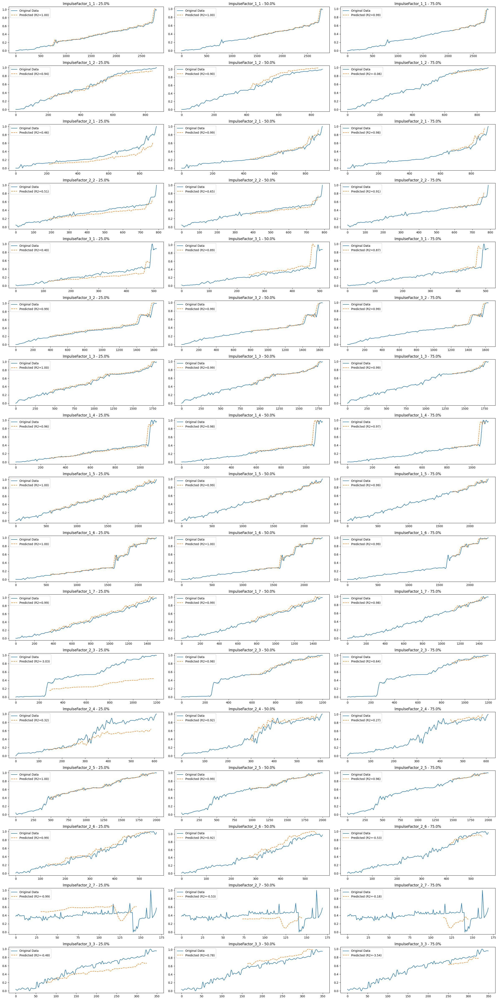

In [171]:
percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_LSTM = []

history_lstm = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

    score = []
    loss_history = []
    
    for j, percentage in enumerate(percentages):
        
        train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

        seq_length = 12
        X_train, y_train = create_sequences(train_dat, seq_length)
        X_test, y_test = create_sequences(test_dat, seq_length)
        
        model = LSTM_model(seq_length)

        history = model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
        
        y_pred = model.predict(X_test, verbose=0)
        scores = get_scores(y_test, y_pred.flatten())
        score.append(scores)

        loss_history.append(history.history)
        
        axs[i, j].plot(signal_df1, label='Original Data')
        axs[i, j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_LSTM.append({signal: score})
    history_lstm.append({signal: loss_history})

plt.tight_layout()
plt.show()


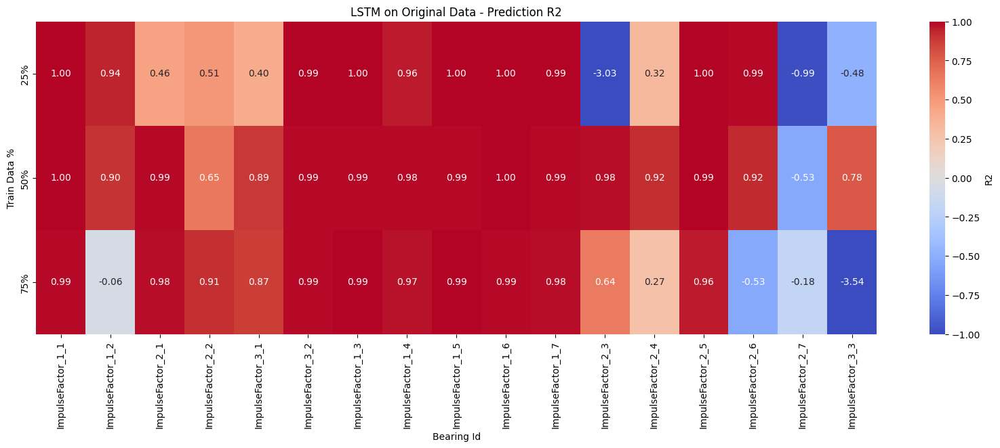

In [172]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('LSTM on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [18]:
r2_scores_dict = {}
for item in r2_scores_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.999301,0.997920,0.985856,0.984176,0.963264,0.997755,0.992872,0.994576,0.999037,0.999497,0.998947,0.891207,0.986655,0.984948,0.991648,-0.337641,0.963976
1,0.999037,0.967205,0.992128,0.982944,0.946036,0.995939,0.984491,0.990495,0.994706,0.998631,0.967801,0.876125,0.937688,0.998395,0.982937,0.080581,0.918224
2,0.995984,0.946240,0.979784,0.962064,0.918587,0.995866,0.981726,0.987851,0.996422,0.982028,0.992754,0.886352,0.650642,0.965838,0.881981,0.138266,0.844622


In [173]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/LSTM.json", 'w') as fp:
    dat = json.dumps(r2_scores_LSTM, indent=4)
    fp.write(dat)

with open("./Performance_Dump/Loss Dump/LSTM.json", 'w') as fp:
    dat = json.dumps(history_lstm, indent=4)
    fp.write(dat)



#### Stacked LSTM - Original Data

In [232]:
def Stacked_LSTM_model(seq_length: int):
    model = Sequential()
    model.add(Input(shape=(seq_length, 1)))  # Add Input layer
    model.add(LSTM(units=512, return_sequences=True))
    model.add(LSTM(units=512, return_sequences=True))
    model.add(LSTM(units=512))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

In [ ]:
percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_Stacked_LSTM = []

history_stacked_lstm = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

    score = []
    loss_history = []
    
    for j, percentage in enumerate(percentages):
        
        train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

        seq_length = 12
        X_train, y_train = create_sequences(train_dat, seq_length)
        X_test, y_test = create_sequences(test_dat, seq_length)
        
        model = Stacked_LSTM_model(seq_length)

        history = model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
        
        y_pred = model.predict(X_test, verbose=0)

        scores = get_scores(y_test, y_pred.flatten())
        score.append(scores)
        
        loss_history.append(history.history)
        
        axs[i, j].plot(signal_df1, label='Original Data')
        axs[i, j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_Stacked_LSTM.append({signal: score})
    history_stacked_lstm.append({signal: loss_history})

plt.tight_layout()
plt.show()


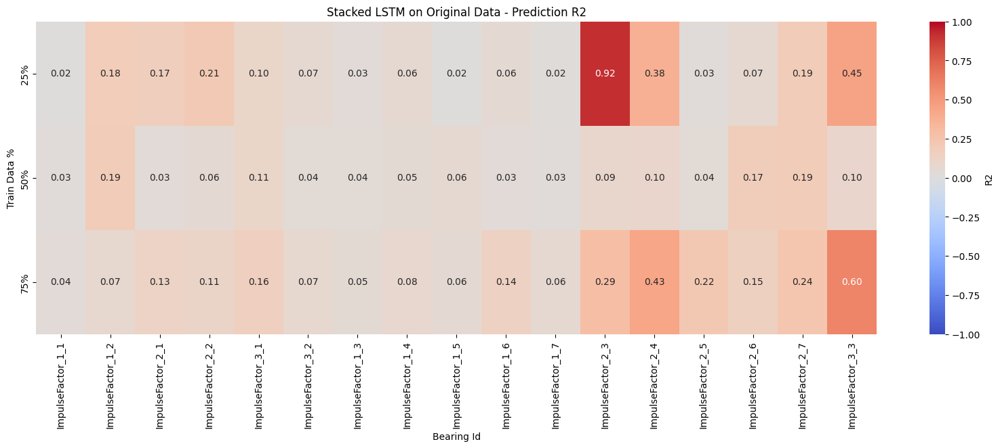

In [178]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_Stacked_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['nrmse'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('Stacked LSTM on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [30]:
r2_scores_dict = {}
for item in r2_scores_Stacked_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.958106,0.974667,0.960126,0.951202,0.937934,0.968389,0.991300,0.975287,0.981535,0.965657,0.969238,0.702811,0.948350,0.929663,0.950834,-0.303191,0.903646
1,0.964438,0.880254,0.990091,0.973545,0.917390,0.994512,0.962234,0.966370,0.913470,0.960663,0.994112,0.561710,0.884485,0.833259,0.977144,-0.191374,0.867117
2,0.932098,0.080303,0.973554,0.937232,0.864791,0.958527,0.948170,0.933368,0.936215,0.582863,0.842562,-0.251969,0.577708,0.652901,0.754067,0.104989,0.784257


In [179]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/Stacked_LSTM.json", 'w') as fp:
    dat = json.dumps(r2_scores_Stacked_LSTM, indent=4)
    fp.write(dat)

with open("./Performance_Dump/Loss Dump/Stacked_LSTM.json", 'w') as fp:
    dat = json.dumps(history_stacked_lstm, indent=4)
    fp.write(dat)


#### GRU - Original Data

In [211]:
from keras.layers import GRU, Dense, Dropout, BatchNormalization
from keras.models import Sequential
from keras.optimizers import Adam

def GRU_model(seq_length: int):
    model = Sequential()
    model.add(Input(shape=(seq_length, 1)))  
    model.add(GRU(units=512))
    model.add(Dense(1, activation='linear'))  
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test


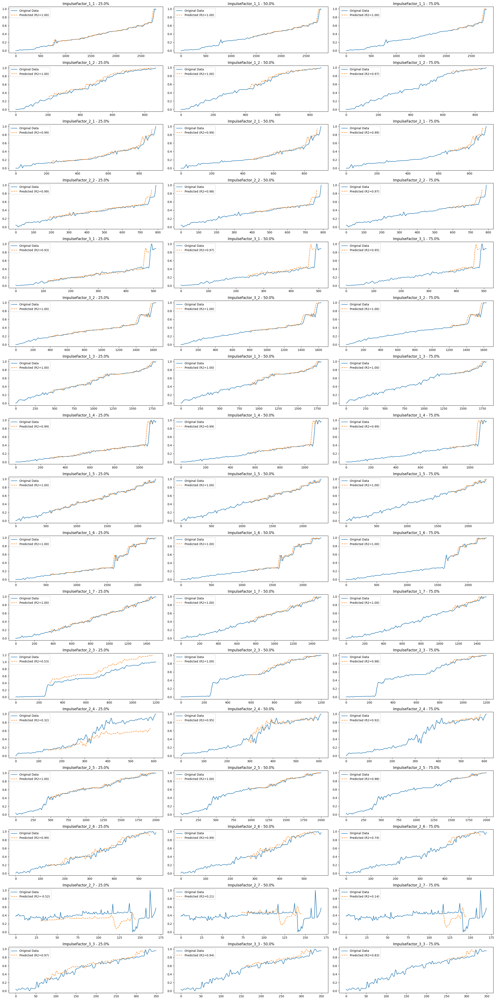

In [214]:
percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_GRU = []
history_GRU = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

    score = []
    loss_history = []
    
    for j, percentage in enumerate(percentages):
        
        train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

        seq_length = 12
        X_train, y_train = create_sequences(train_dat, seq_length)
        X_test, y_test = create_sequences(test_dat, seq_length)
        
        model = GRU_model(seq_length)

        history = model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
        
        y_pred = model.predict(X_test, verbose=0)

        scores = get_scores(y_test, y_pred)
        score.append(scores)

        loss_history.append(history.history)
        
        axs[i, j].plot(signal_df1, label='Original Data')
        axs[i, j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_GRU.append({signal: score})
    history_GRU.append({signal: loss_history})

plt.tight_layout()
plt.show()


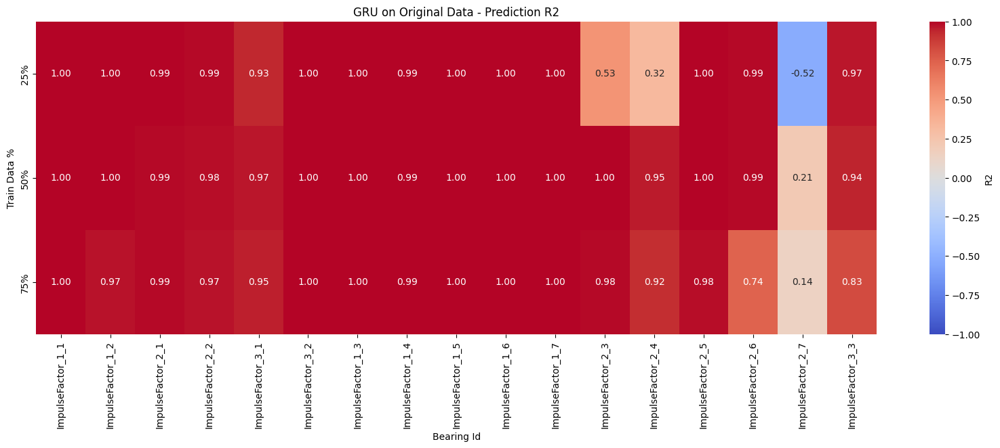

In [215]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('GRU on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [217]:
r2_scores_dict = {}
for item in r2_scores_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['pro_score'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.974249,0.851815,0.901068,0.910623,0.738463,0.965565,0.962123,0.913187,0.963034,0.934305,0.923386,0.073792,0.356218,0.926252,0.839481,0.390629,0.819593
1,0.982715,0.956962,0.895078,0.942265,0.833655,0.964898,0.973703,0.926004,0.972776,0.910734,0.935516,0.967930,0.847402,0.973534,0.870382,0.391025,0.865834
2,0.982041,0.978860,0.914123,0.928420,0.835012,0.942237,0.974999,0.923562,0.978988,0.969823,0.963908,0.977923,0.923574,0.977365,0.899246,0.400339,0.896027


In [218]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/GRU.json", 'w') as fp:
    dat = json.dumps(r2_scores_GRU, indent=4)
    fp.write(dat)

with open("./Performance_Dump/Loss Dump/GRU.json", 'w') as fp:
    dat = json.dumps(history_GRU, indent=4)
    fp.write(dat)

#### LSTM-GRU - Original Data

In [224]:
def LSTM_GRU_model(seq_length: int):
    model = Sequential()
    model.add(Input(shape=(seq_length, 1)))  # Add Input layer
    model.add(GRU(units=512, return_sequences=True))
    model.add(LSTM(units=512))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(), loss='mse')
    return model

C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test
C:\Users\devbh\AppData\Local\Temp\ipykernel_28356\1479799215.py:22: RuntimeWarning: divide by zero encountered in divide
  percent_errors = 100 * (y_test - y_pred.flatten()) / y_test


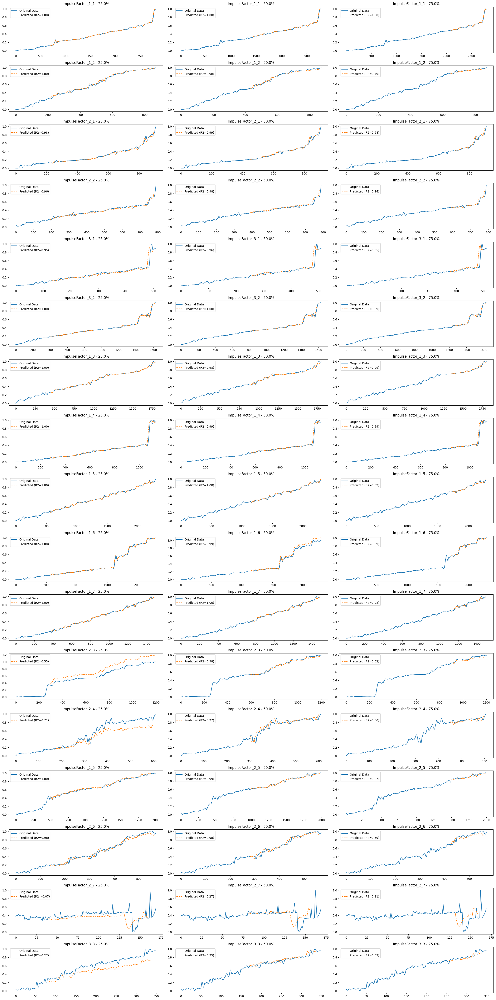

In [226]:
percentages = [0.25, 0.5, 0.75]

signals = transformed_rms.columns

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 48))

r2_scores_LSTM_GRU = []

history_lstm_gru = []

for i, signal in enumerate(signals):
    signal_df1 = transformed_rms[signal]
    signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

    score = []
    loss_history = []
    
    for j, percentage in enumerate(percentages):
        
        train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

        seq_length = 5
        X_train, y_train = create_sequences(train_dat, seq_length)
        X_test, y_test = create_sequences(test_dat, seq_length)
        
        model = LSTM_GRU_model(seq_length)

        history = model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
        
        y_pred = model.predict(X_test, verbose=0)

        scores = get_scores(y_test, y_pred)
        score.append(scores)

        loss_history.append(history.history)
        
        axs[i, j].plot(signal_df1, label='Original Data')
        axs[i, j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
        axs[i, j].set_title(f"{signal} - {percentage * 100}%")
        axs[i, j].legend()
    
    r2_scores_LSTM_GRU.append({signal: score})
    history_lstm_gru.append({signal: loss_history})

plt.tight_layout()
plt.show()


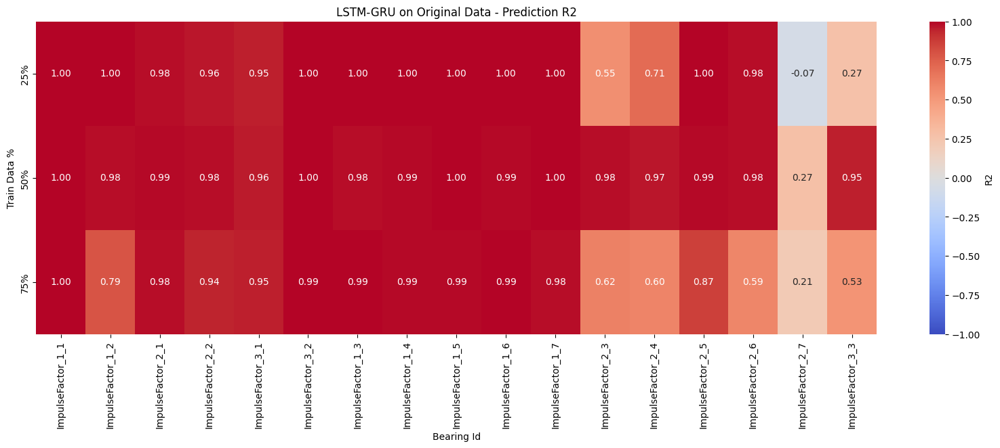

In [230]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_LSTM_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('LSTM-GRU on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

In [228]:
r2_scores_dict = {}
for item in r2_scores_LSTM_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['pro_score'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()
df_scores

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.965366,0.926346,0.827419,0.841009,0.787215,0.942907,0.956239,0.906400,0.952418,0.958580,0.939352,0.075371,0.522734,0.861000,0.819066,0.522346,0.455019
1,0.916439,0.917408,0.913983,0.838435,0.858381,0.955312,0.930937,0.924559,0.953643,0.626433,0.952660,0.928501,0.827530,0.954720,0.866236,0.506262,0.838613
2,0.979520,0.949270,0.909118,0.912967,0.817184,0.942511,0.979793,0.890970,0.962754,0.961482,0.950959,0.890900,0.899051,0.934934,0.846357,0.321870,0.825503


In [231]:
import json
# dump scores
with open("./Performance_Dump/SASD RUL - Pronostia Dataset/LSTM_GRU.json", 'w') as fp:
    dat = json.dumps(r2_scores_LSTM_GRU, indent=4)
    fp.write(dat)

with open("./Performance_Dump/Loss Dump/LSTM_GRU.json", 'w') as fp:
    dat = json.dumps(history_lstm_gru, indent=4)
    fp.write(dat)

## SASD RUL - Custom dataset

#### Preprocessing

In [66]:
def extractFeatures(raw_data, window_size):
    def SlidingWindow(data, window_length, window_shift, column):
            mov = np.lib.stride_tricks.sliding_window_view(data[column], window_length)[::window_shift]
            return np.array(mov)

    mov1 = SlidingWindow(raw_data, window_size, window_size, "vib1")
    mov2 = SlidingWindow(raw_data, window_size, window_size, "vib2")

    mean_x = np.mean(mov1, axis=1).reshape(-1,1)
    rms_x = np.sqrt(np.mean(np.array(mov1)**2, axis=1)).reshape(-1,1)
    var_x = np.var(mov1, axis=1).reshape(-1,1)
    std_x = np.std(mov1, axis=1).reshape(-1,1)
    min_abs_x = np.min(np.abs(mov1), axis=1).reshape(-1,1)
    max_abs_x = np.max(np.abs(mov1), axis=1).reshape(-1,1)
    max_x = np.max(mov1, axis=1).reshape(-1,1)
    p2p_x = np.ptp(mov1, axis=1).reshape(-1,1)
    # crest_factor_x = np.max(np.abs(mov1), axis=1) / np.sqrt(np.mean(np.square(mov1), axis=1)).reshape(-1,1)
    impulse_factor_x = (np.max(np.abs(mov1),axis=1)/np.mean(np.abs(mov1),axis=1)).reshape(-1,1)


    mean_y = np.mean(mov2, axis=1).reshape(-1,1)
    rms_y = np.sqrt(np.mean(np.array(mov2)**2, axis=1)).reshape(-1,1)
    var_y = np.var(mov2, axis=1).reshape(-1,1)
    std_y = np.std(mov2, axis=1).reshape(-1,1)
    min_abs_y = np.min(np.abs(mov2), axis=1).reshape(-1,1)
    max_abs_y = np.max(np.abs(mov2), axis=1).reshape(-1,1)
    max_y = np.max(mov2, axis=1).reshape(-1,1)
    p2p_y = np.ptp(mov2, axis=1).reshape(-1,1)
    # crest_factor_y = np.max(np.abs(mov2), axis=1) / np.sqrt(np.mean(np.square(mov2), axis=1)).reshape(-1,1)
    impulse_factor_y = (np.max(np.abs(mov2),axis=1)/np.mean(np.abs(mov2),axis=1)).reshape(-1,1)

    columns = ["mean_x", "mean_y", "rms_x", "rms_y", "var_x", "var_y", "std_x", "std_y", "min_abs_x", "min_abs_y", "max_abs_x", "max_abs_y", "max_x", "max_y", "p2p_x", "p2p_y", "impulse_factor_x", "impulse_factor_y"]
    features = [mean_x, mean_y, rms_x, rms_y, var_x, var_y, std_x, std_y, min_abs_x, min_abs_y, max_abs_x, max_abs_y, max_x, max_y, p2p_x, p2p_y, impulse_factor_x, impulse_factor_y]

    return columns, features

raw_data = pd.read_csv("../Custom Dataset/dataset.csv")

# remove bad part in the end
size = int(raw_data.shape[0] * 0.6)
raw_data = raw_data.iloc[:size]

# 1% resolution
raw_data = raw_data.iloc[::1000, :]
column_names, column_data = extractFeatures(raw_data, int(np.log10(raw_data.shape[0])))
extracted_data = pd.DataFrame(np.concatenate(column_data, axis=1), columns=column_names)
extracted_data.to_csv(f"../Custom Dataset/dataset_Features.csv")

In [67]:
int(np.log10(raw_data.shape[0]))

4

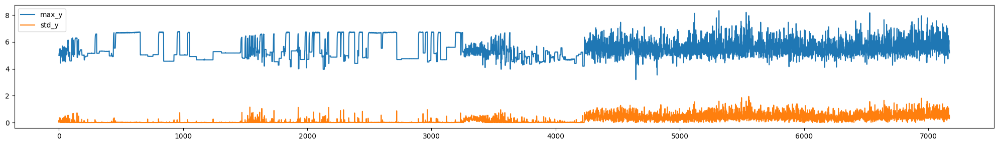

In [68]:
plt.figure(figsize=(20,3))
plt.plot(extracted_data["max_y"], label="max_y")
plt.plot(extracted_data["std_y"], label="std_y")
plt.legend()
plt.tight_layout()

Size: 3300
Window Factor: 100
Chunks: 33


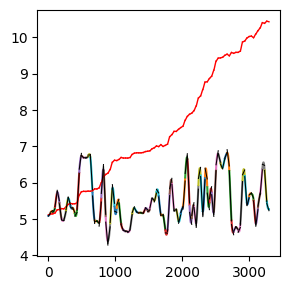

In [70]:
from sklearn.preprocessing import MinMaxScaler

transformed_feature = pd.DataFrame()
new_signal = pd.Series(SASD(data=extracted_data["max_y"][:3300], id="", preSmoothingFactor=45, windowFactor=100, slopeThreshold=0.4, elevationFactor=60, postSmoothingFactor=0.4))

# normalize values
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(new_signal.values.reshape(-1, 1))
new_signal_normalized = pd.Series(normalized_data.flatten())

# store values
new_signal_normalized.name = "0"
transformed_feature = pd.concat([transformed_feature, new_signal_normalized], axis=1)


In [71]:
transformed_feature.to_csv("../Custom Dataset/SASD Extracted Data/RAW.csv")

In [3]:
transformed_feature = pd.read_csv("../Custom Dataset/SASD Extracted Data/RAW.csv")

In [4]:
transformed_feature

,Unnamed: 0,0
0,0,0.000000
1,1,0.000087
2,2,0.000177
3,3,0.000270
4,4,0.000366
...,...,...
3295,3295,0.997326
3296,3296,0.997244
3297,3297,0.997164
3298,3298,0.997088


In [74]:
exp_fit = pd.DataFrame()
logistic_fit = pd.DataFrame()

dat = transformed_feature["0"]
dat = dat[~np.isnan(dat)]

exp = fit_ExponentialDecayCurve(dat)
logistic = fit_LogisticGrowthModel(dat)

# store values
exp = pd.Series(exp)
exp.name = "0"

logistic = pd.Series(logistic)
logistic.name = "0"

exp_fit = pd.concat([exp_fit, exp], axis=1)
logistic_fit = pd.concat([logistic_fit, logistic], axis=1)

exp_fit.to_csv("../Custom Dataset/SASD Extracted Data/EXP.csv")
logistic_fit.to_csv("../Custom Dataset/SASD Extracted Data/LOGISTIC.csv")

C:\Users\devbh\AppData\Local\Temp\ipykernel_25916\2615926155.py:7: RuntimeWarning: overflow encountered in exp
  return L / (1 + np.exp(-k * (t - t0)))


#### Model Training imports

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error
from keras.models import Sequential
from keras.layers import Dense, LSTM, GRU
from keras.callbacks import EarlyStopping

In [7]:
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

def get_scores(y_test, y_pred):
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    # msle = mean_squared_log_error(y_test, y_pred)
    # rmsle = np.sqrt(mean_squared_log_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return {"R2": r2, "mse":mse, "rmse":rmse, "mae":mae, "mape":mape}
    # return {"R2": r2, "mse":mse, "rmse":rmse, "msle":msle, "rmsle":rmsle, "mae":mae, "mape":mape}

callback = EarlyStopping(monitor='loss', patience=3)

In [8]:
transformed_feature = pd.read_csv("../Custom Dataset/SASD Extracted Data/RAW.csv", index_col=0)
exp_fit = pd.read_csv("../Custom Dataset/SASD Extracted Data/EXP.csv", index_col=0)
logistic_fit = pd.read_csv("../Custom Dataset/SASD Extracted Data/LOGISTIC.csv", index_col=0)

#### Polynomial Regression - Logistic Growth

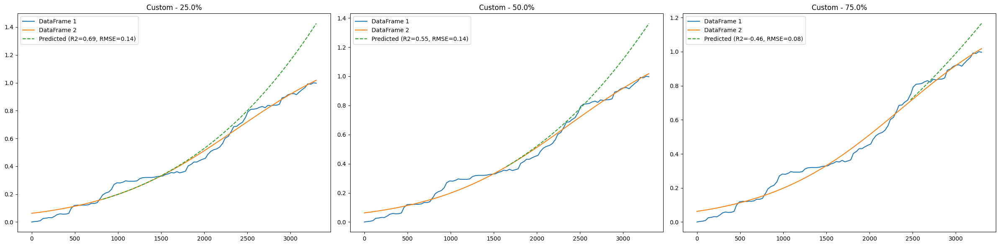

In [75]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_logistic = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)]

signal_df2 = logistic_fit[signals]
signal_df2 = signal_df2[~np.isnan(signal_df2)]

score = []

for j, percentage in enumerate(percentages):
    train_size = int(len(signal_df2) * percentage)
    train_data, test_data = signal_df2[:train_size], signal_df2[train_size:]
    
    X_train = np.arange(len(train_data)).reshape(-1, 1)
    y_train = train_data.values.reshape(-1, 1)
    
    X_test = np.arange(len(train_data), len(signal_df2)).reshape(-1, 1)
    
    degree = 3
    poly_features = PolynomialFeatures(degree=degree)
    X_train_poly = poly_features.fit_transform(X_train)
    X_test_poly = poly_features.transform(X_test)
    
    model = LinearRegression()
    model.fit(X_train_poly, y_train)
    
    y_pred = model.predict(X_test_poly)

    r2 = r2_score(signal_df1[train_size:], y_pred)
    rmse = np.sqrt(mean_squared_error(signal_df1[train_size:], y_pred))

    score.append(r2)
    
    axs[j].plot(signal_df1, label='DataFrame 1')
    axs[j].plot(signal_df2, label='DataFrame 2')
    axs[j].plot(np.arange(len(train_data), len(signal_df2)), y_pred, label=f'Predicted (R2={r2:.2f}, RMSE={rmse:.2f})', linestyle='dashed')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_logistic.append({"Custom": score})

plt.tight_layout()
plt.show()

#### GPR - Logistic Growth

c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\devbh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations

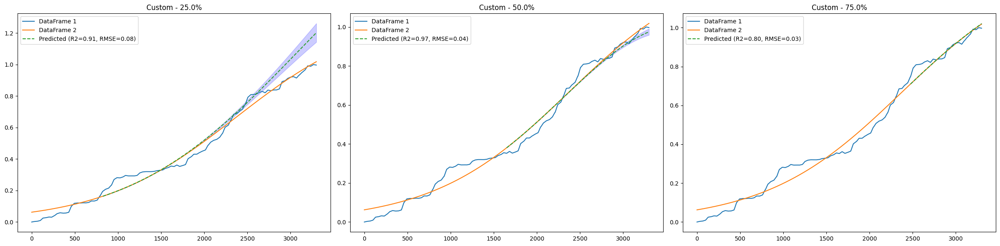

In [77]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.metrics import r2_score, mean_squared_error

percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_GPR_logistic = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)]

signal_df2 = logistic_fit[signals]
signal_df2 = signal_df2[~np.isnan(signal_df2)]

score = []

for j, percentage in enumerate(percentages):
    train_size = int(len(signal_df2) * percentage)
    train_data, test_data = signal_df2[:train_size], signal_df2[train_size:]
    
    X_train = np.arange(len(train_data)).reshape(-1, 1)
    y_train = train_data.values.reshape(-1, 1)
    
    X_test = np.arange(len(train_data), len(signal_df2)).reshape(-1, 1)
    
    kernel = RBF(length_scale=1.0)
    gpr = GaussianProcessRegressor(kernel=kernel, random_state=3, n_restarts_optimizer=20)
    
    gpr.fit(X_train, y_train.flatten())
    
    y_pred, sigma = gpr.predict(X_test, return_std=True)
    
    r2 = r2_score(signal_df1[train_size:], y_pred)
    rmse = np.sqrt(mean_squared_error(signal_df1[train_size:], y_pred))

    score.append(r2)
    
    axs[j].plot(signal_df1, label='DataFrame 1')
    axs[j].plot(signal_df2, label='DataFrame 2')
    axs[j].plot(np.arange(len(train_data), len(signal_df2)), y_pred, label=f'Predicted (R2={r2:.2f}, RMSE={rmse:.2f})', linestyle='dashed')
    axs[j].fill_between(np.arange(len(train_data), len(signal_df2)), y_pred - sigma, y_pred + sigma, alpha=0.2, color='blue')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_GPR_logistic.append({"Custom": score})

plt.tight_layout()
plt.show()


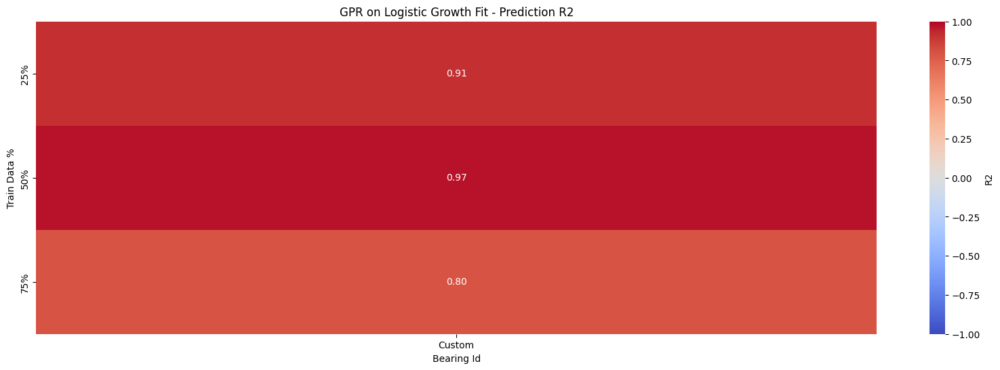

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

df_scores = pd.DataFrame({k: v for d in r2_scores_GPR_logistic for k, v in d.items()})

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('GPR on Logistic Growth Fit - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()


#### LSTM - Custom Data

In [10]:
def LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=200, activation='relu', input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

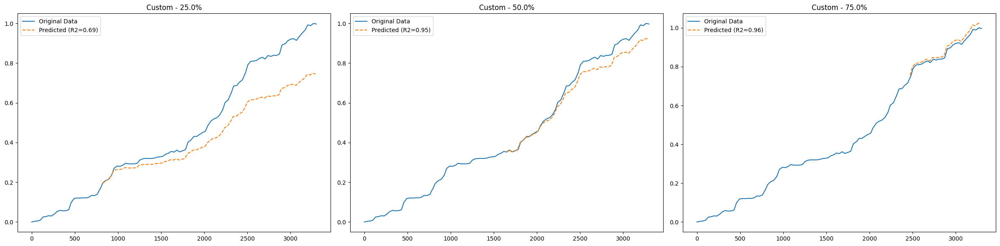

In [13]:
percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_LSTM = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

score = []
    
for j, percentage in enumerate(percentages):
    
    train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

    seq_length = 5
    X_train, y_train = create_sequences(train_dat, seq_length)
    X_test, y_test = create_sequences(test_dat, seq_length)
    
    model = LSTM_model(seq_length)

    model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
    
    y_pred = model.predict(X_test, verbose=0)

    scores = get_scores(y_test, y_pred)
    score.append(scores)
    
    axs[j].plot(signal_df1, label='Original Data')
    axs[j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_LSTM.append({"Custom": score})

plt.tight_layout()
plt.show()


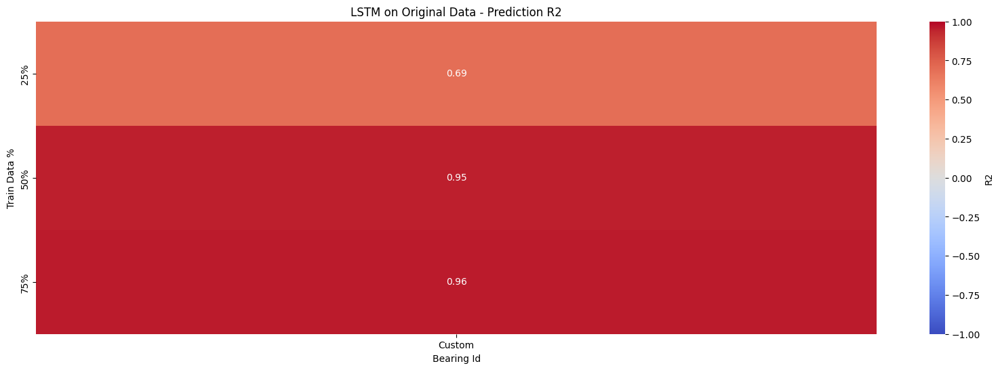

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('LSTM on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

#### Stacked LSTM - Custom Data

In [28]:
def Stacked_LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=64, return_sequences=True))
    model.add(LSTM(units=32))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

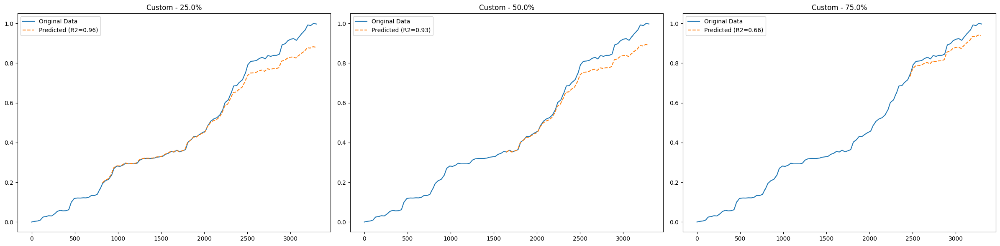

In [29]:
percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_Stacked_LSTM = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

score = []
    
for j, percentage in enumerate(percentages):
    
    train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

    seq_length = 5
    X_train, y_train = create_sequences(train_dat, seq_length)
    X_test, y_test = create_sequences(test_dat, seq_length)
    
    model = Stacked_LSTM_model(seq_length)

    model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
    
    y_pred = model.predict(X_test, verbose=0)

    scores = get_scores(y_test, y_pred)
    score.append(scores)
    
    axs[j].plot(signal_df1, label='Original Data')
    axs[j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_Stacked_LSTM.append({"Custom": score})

plt.tight_layout()
plt.show()


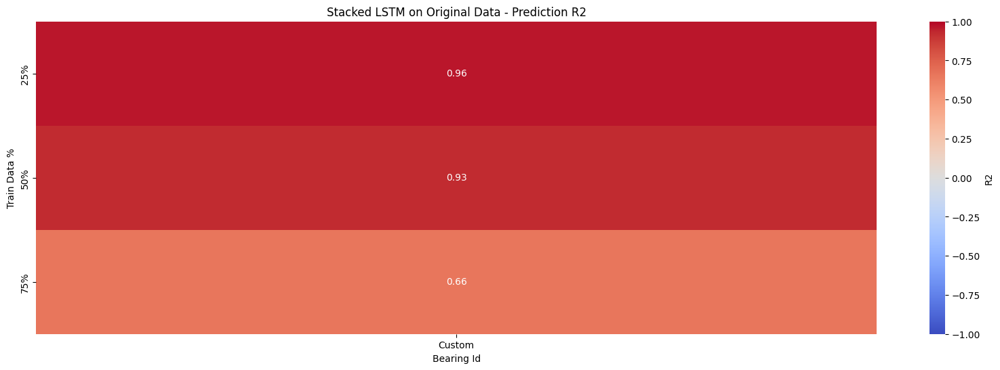

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_Stacked_LSTM:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('Stacked LSTM on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

#### GRU - Custom Data

In [26]:
def GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

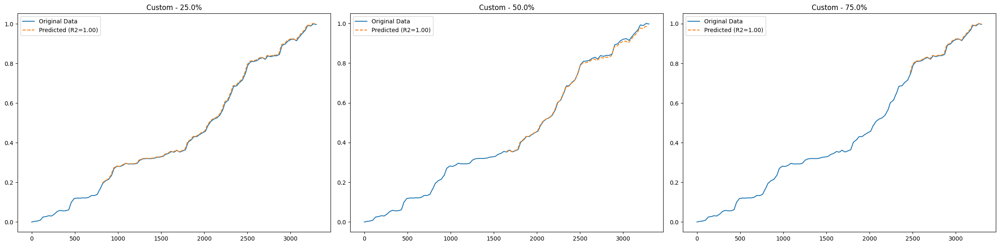

In [27]:
percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_GRU = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

score = []
    
for j, percentage in enumerate(percentages):
    
    train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

    seq_length = 5
    X_train, y_train = create_sequences(train_dat, seq_length)
    X_test, y_test = create_sequences(test_dat, seq_length)
    
    model = GRU_model(seq_length)

    model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
    
    y_pred = model.predict(X_test, verbose=0)

    scores = get_scores(y_test, y_pred)
    score.append(scores)
    
    axs[j].plot(signal_df1, label='Original Data')
    axs[j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_GRU.append({"Custom": score})

plt.tight_layout()
plt.show()


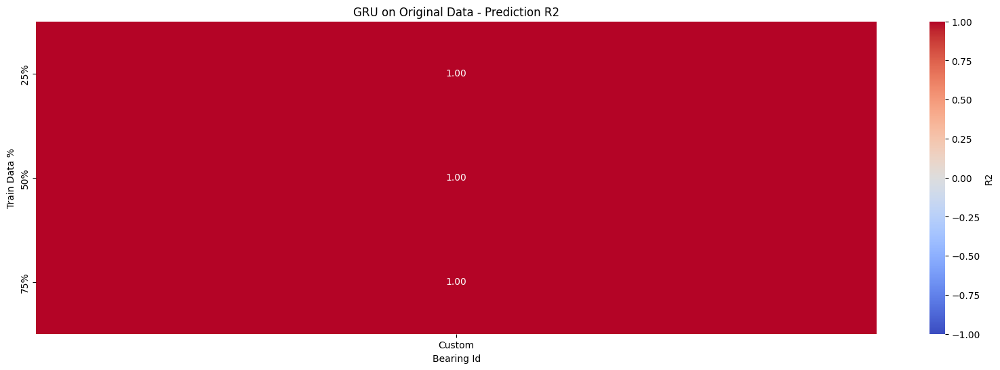

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('GRU on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

#### LSTM-GRU - Custom Data

In [29]:
def LSTM_GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=128))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

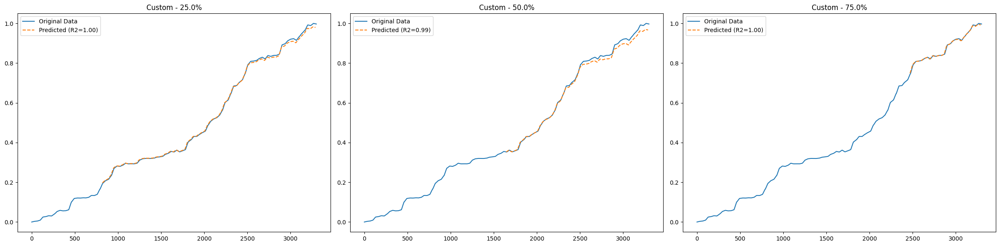

In [30]:
percentages = [0.25, 0.5, 0.75]

signals = "0"

fig, axs = plt.subplots(len(signals), len(percentages), figsize=(24, 6))

r2_scores_LSTM_GRU = []

signal_df1 = transformed_feature[signals]
signal_df1 = signal_df1[~np.isnan(signal_df1)].to_numpy()

score = []
    
for j, percentage in enumerate(percentages):
    
    train_dat, test_dat = train_test_split(signal_df1, train_size=percentage, shuffle=False)

    seq_length = 5
    X_train, y_train = create_sequences(train_dat, seq_length)
    X_test, y_test = create_sequences(test_dat, seq_length)
    
    model = LSTM_GRU_model(seq_length)

    model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])
    
    y_pred = model.predict(X_test, verbose=0)

    scores = get_scores(y_test, y_pred)
    score.append(scores)
    
    axs[j].plot(signal_df1, label='Original Data')
    axs[j].plot(np.array(list(range(len(y_test)))) + len(y_train), y_pred, label=f'Predicted (R2={scores["R2"]:.2f})', linestyle='dashed')
    axs[j].set_title(f"Custom - {percentage * 100}%")
    axs[j].legend()

r2_scores_LSTM_GRU.append({"Custom": score})

plt.tight_layout()
plt.show()


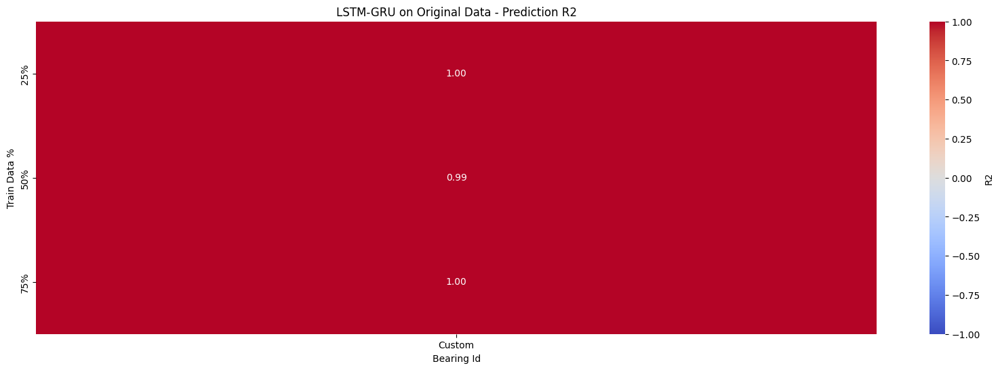

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

r2_scores_dict = {}
for item in r2_scores_LSTM_GRU:
    for key, value in item.items():
        r2_scores_dict[key] = [d['R2'] for d in value]

df_scores = pd.DataFrame.from_dict(r2_scores_dict, orient='index')
df_scores = df_scores.transpose()

plt.figure(figsize=(20, 6))
sns.heatmap(df_scores, cmap='coolwarm', annot=True, vmin=-1, vmax=1, fmt='.2f', cbar_kws={'label': 'R2'}, yticklabels=["25%", "50%", "75%"])
plt.title('LSTM-GRU on Original Data - Prediction R2')
plt.xlabel('Bearing Id')
plt.ylabel('Train Data %')
plt.show()

## Model Generalization

#### Imports, Functions and Pre-Processing

In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error
from keras.models import Sequential
from keras.layers import Dense, LSTM, GRU
from keras.callbacks import EarlyStopping

In [144]:
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

def get_scores(y_test, y_pred):
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    # msle = mean_squared_log_error(y_test, y_pred)
    # rmsle = np.sqrt(mean_squared_log_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return {"R2": r2, "mse":mse, "rmse":rmse, "mae":mae, "mape":mape}
    # return {"R2": r2, "mse":mse, "rmse":rmse, "msle":msle, "rmsle":rmsle, "mae":mae, "mape":mape}

callback = EarlyStopping(monitor='loss', patience=3)

import the data and scale all signals to same length so we can do some kind of correlation analysis

In [137]:
signals = pd.read_csv("./SASD Extracted Data/RAW.csv")
signals = signals[signals.columns[1:]]
signals

,ImpulseFactor_1_1,ImpulseFactor_1_2,ImpulseFactor_2_1,ImpulseFactor_2_2,ImpulseFactor_3_1,ImpulseFactor_3_2,ImpulseFactor_1_3,ImpulseFactor_1_4,ImpulseFactor_1_5,ImpulseFactor_1_6,ImpulseFactor_1_7,ImpulseFactor_2_3,ImpulseFactor_2_4,ImpulseFactor_2_5,ImpulseFactor_2_6,ImpulseFactor_2_7,ImpulseFactor_3_3
0,0.000000,0.001399,0.000676,0.044932,0.018353,0.001203,0.000000,0.000703,0.000648,0.003678,0.001663,0.000000,0.000000,0.039213,0.005046,0.378655,0.039360
1,0.000016,0.001283,0.000694,0.044126,0.015866,0.001183,0.000627,0.000869,0.000781,0.003638,0.001516,0.001100,0.003504,0.037119,0.010975,0.403901,0.031704
2,0.000043,0.001136,0.000741,0.042941,0.012541,0.001140,0.001496,0.001049,0.001028,0.003567,0.001242,0.002115,0.008416,0.034357,0.017799,0.387570,0.021760
3,0.000080,0.000962,0.000821,0.041327,0.008736,0.001081,0.002422,0.001235,0.001383,0.003471,0.000931,0.003143,0.014573,0.031649,0.024487,0.427610,0.014009
4,0.000124,0.000769,0.000927,0.039253,0.004988,0.001009,0.003416,0.001417,0.001801,0.003368,0.000646,0.004138,0.021609,0.028980,0.029788,0.415286,0.013834
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2795,0.983955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2796,0.981961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2797,0.980307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2798,0.979112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [138]:
# column ehaders for each condition

condition_1_column_names = [name for name in [x for x in signals.columns] if "1_" in name]
condition_2_column_names = [name for name in [x for x in signals.columns] if "2_" in name]
condition_3_column_names = [name for name in [x for x in signals.columns] if "3_" in name]

#### Compute condition 1, 2 and 3 sequences and predictions and dump them

In [143]:
seq_len = 5

condition_1_sequences = []
for column in condition_1_column_names:
    # remove nan
    column_data = signals[column]
    column_data = column_data[~np.isnan(column_data)]

    x = create_sequences(column_data.values, seq_len)
    if(len(condition_1_sequences) == 0):
        condition_1_sequences.append(x[0])
        condition_1_sequences.append(x[1])
        continue
    condition_1_sequences[0] = np.concatenate((condition_1_sequences[0], x[0]), axis=0)
    condition_1_sequences[1] = np.concatenate((condition_1_sequences[1], x[1]), axis=0)
    
    # display signals and print shape of combined sequences for each signal
    # as well as concatinated shape for each iteration (skips the initialization display when length of condition_1_sequences = 0)
    # print(x[0].shape, condition_1_sequences[0].shape)
    # plt.plot(x[1])


sequences = condition_1_sequences[0]
predictions = condition_1_sequences[1]
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_1_sequences.npy", sequences)
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_1_predictions.npy", predictions)

In [144]:
seq_len = 5

condition_2_sequences = []
for column in condition_2_column_names:
    # remove nan
    column_data = signals[column]
    column_data = column_data[~np.isnan(column_data)]

    x = create_sequences(column_data.values, seq_len)
    if(len(condition_2_sequences) == 0):
        condition_2_sequences.append(x[0])
        condition_2_sequences.append(x[1])
        continue
    condition_2_sequences[0] = np.concatenate((condition_2_sequences[0], x[0]), axis=0)
    condition_2_sequences[1] = np.concatenate((condition_2_sequences[1], x[1]), axis=0)
    
    # display signals and print shape of combined sequences for each signal
    # as well as concatinated shape for each iteration (skips the initialization display when length of condition_1_sequences = 0)
    # print(x[0].shape, condition_1_sequences[0].shape)
    # plt.plot(x[1])


sequences = condition_2_sequences[0]
predictions = condition_2_sequences[1]
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_2_sequences.npy", sequences)
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_2_predictions.npy", predictions)

In [145]:
seq_len = 5

condition_3_sequences = []
for column in condition_3_column_names:
    # remove nan
    column_data = signals[column]
    column_data = column_data[~np.isnan(column_data)]

    x = create_sequences(column_data.values, seq_len)
    if(len(condition_3_sequences) == 0):
        condition_3_sequences.append(x[0])
        condition_3_sequences.append(x[1])
        continue
    condition_3_sequences[0] = np.concatenate((condition_3_sequences[0], x[0]), axis=0)
    condition_3_sequences[1] = np.concatenate((condition_3_sequences[1], x[1]), axis=0)
    
    # display signals and print shape of combined sequences for each signal
    # as well as concatinated shape for each iteration (skips the initialization display when length of condition_1_sequences = 0)
    # print(x[0].shape, condition_1_sequences[0].shape)
    # plt.plot(x[1])


sequences = condition_3_sequences[0]
predictions = condition_3_sequences[1]
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_3_sequences.npy", sequences)
np.save("./SASD Extracted Data/Generalization Sequences/Learning Set/condition_3_predictions.npy", predictions)

#### Preload data for training and testing Phase

In [5]:
# Import Train and test data
condition_1_sequences = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_1_sequences.npy")
condition_1_predictions = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_1_predictions.npy")

condition_2_sequences = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_2_sequences.npy")
condition_2_predictions = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_2_predictions.npy")

condition_3_sequences = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_3_sequences.npy")
condition_3_predictions = np.load("../Pronostia Public Dataset/SASD Extracted Data/Generalization Sequences/Learning Set/condition_3_predictions.npy")

signals = pd.read_csv("./SASD Extracted Data/RAW.csv")
signals = signals[signals.columns[1:]]

condition_1_column_names = [name for name in [x for x in signals.columns] if "1_" in name]
condition_2_column_names = [name for name in [x for x in signals.columns] if "2_" in name]
condition_3_column_names = [name for name in [x for x in signals.columns] if "3_" in name]

#### Train Test - Condition 1

LSTM

In [163]:
# Model Definition

def LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=200, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_1_sequences, condition_1_predictions
model = LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [164]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_1 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_1[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_1_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_1, indent=4)
    fp.write(dat)

Stacked LSTM

In [169]:
# Model Definition

def Stacked_LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=64, return_sequences=True))
    model.add(LSTM(units=32))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_1_sequences, condition_1_predictions
model = Stacked_LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [170]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_1 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_1[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_1_Stacked_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_1, indent=4)
    fp.write(dat)

GRU

In [171]:
# Model Definition

def GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_1_sequences, condition_1_predictions
model = GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [172]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_1 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_1[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_1_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_1, indent=4)
    fp.write(dat)

LSTM - GRU

In [173]:
# Model Definition

def LSTM_GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=128))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_1_sequences, condition_1_predictions
model = LSTM_GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [174]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_1 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_1[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_1_LSTM_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_1, indent=4)
    fp.write(dat)

#### Train Test - Condition 2

LSTM

In [8]:
# Model Definition

def LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=200, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_2_sequences, condition_2_predictions
model = LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [9]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_2 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_2[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_2_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_2, indent=4)
    fp.write(dat)

Stacked LSTM

In [10]:
# Model Definition

def Stacked_LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=64, return_sequences=True))
    model.add(LSTM(units=32))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_2_sequences, condition_2_predictions
model = Stacked_LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [11]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_2 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_2[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_2_Stacked_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_2, indent=4)
    fp.write(dat)

GRU

In [12]:
# Model Definition

def GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_2_sequences, condition_2_predictions
model = GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [13]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_2 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_2[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_2_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_2, indent=4)
    fp.write(dat)

LSTM - GRU

In [14]:
# Model Definition

def LSTM_GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=128))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_2_sequences, condition_2_predictions
model = LSTM_GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [15]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_2 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_2[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_2_LSTM_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_2, indent=4)
    fp.write(dat)

#### Train Test - Condition 3

LSTM

In [22]:
# Model Definition

def LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=200, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_3_sequences, condition_3_predictions
model = LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [23]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_3 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_3[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_3_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_3, indent=4)
    fp.write(dat)

Stacked LSTM

In [24]:
# Model Definition

def Stacked_LSTM_model(seq_length: int):
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=64, return_sequences=True))
    model.add(LSTM(units=32))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_3_sequences, condition_3_predictions
model = Stacked_LSTM_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [25]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_3 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_3[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_3_Stacked_LSTM.json", 'w') as fp:
    dat = json.dumps(performance_condition_3, indent=4)
    fp.write(dat)

GRU

In [26]:
# Model Definition

def GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, input_shape=(seq_length, 1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_3_sequences, condition_3_predictions
model = GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [27]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_3 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_3[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_3_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_3, indent=4)
    fp.write(dat)

LSTM - GRU

In [28]:
# Model Definition

def LSTM_GRU_model(seq_length: int):
    model = Sequential()
    model.add(GRU(units=128, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=128))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model


# model training

X_train, y_train = condition_3_sequences, condition_3_predictions
model = LSTM_GRU_model(seq_length=5)
model.fit(X_train, y_train, validation_split=0.15, epochs=100, verbose=0, callbacks=[callback])

In [30]:
# model testing

# performance_condition_1 = {
#     "column_1": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     "column_2": {"R2": ..., "mse": ..., "rmse": ..., "mae": ..., "mape": ...},
#     .
#     .
#     .
# }

import json

performance_condition_3 = {}

conditions = [condition_1_column_names, condition_2_column_names, condition_3_column_names]

# access all columns of a condition
for condition in conditions:
    # access each column name for the accessed condition
    for column in condition:
        # load data and remove nan
        column_data = signals[column]
        column_data = column_data[~np.isnan(column_data)]

        # create sequences and predictions
        seq, pred = create_sequences(column_data.values, 5)

        # get predictions and scores
        y_pred = model.predict(seq, verbose=0)
        scores = get_scores(pred, y_pred)

        performance_condition_3[column] = scores

# dump scores
with open("./Performance_Dump/performance_condition_3_LSTM_GRU.json", 'w') as fp:
    dat = json.dumps(performance_condition_3, indent=4)
    fp.write(dat)